In [1]:
import numpy as np
import os
# os.environ["JAX_LOG_COMPILES"] = "True"

import copy
import matplotlib
import matplotlib.pyplot as plt
import scipy
from scipy.constants import mu_0
%matplotlib inline
import sys
sys.path.insert(0, os.path.abspath('.'))
sys.path.append(os.path.abspath('../'))
import functools

import jax
import jax.numpy as jnp
from jax import jit, jacfwd

from netCDF4 import Dataset
import h5py

from desc.backend import put
from desc.basis import FourierZernikeBasis, DoubleFourierSeries, FourierSeries
# from desc.boundary_conditions import get_boundary_condition, LCFSConstraint
from desc.equilibrium import EquilibriaFamily, Equilibrium
from desc.grid import ConcentricGrid, LinearGrid, Grid, QuadratureGrid
from desc.io import InputReader, load
from desc.plotting import plot_1d, plot_2d, plot_3d, plot_section, plot_surfaces, plot_comparison
from desc.transform import Transform
from desc.vmec import VMECIO
from desc.derivatives import Derivative
from desc.profiles import SplineProfile
from desc.magnetic_fields import SplineMagneticField

from desc.utils import flatten_list
os.getcwd()

DESC version 0.4.13+610.g5905668.dirty, using JAX backend, jax version=0.2.25, jaxlib version=0.1.76, dtype=float64
Using device: CPU, with 11.96 GB available memory


'/home/fouriest/SCHOOL/Princeton/PPPL/DESC_freeb'

In [2]:
from desc.objectives.objective_funs import _Objective
from desc.compute import compute_contravariant_basis, compute_contravariant_magnetic_field, compute_pressure
from desc.utils import unpack_state
from desc.geometry.utils import rpz2xyz, rpz2xyz_vec, xyz2rpz_vec, rotation_matrix

@jax.jit  
def biot_loop(re, rs, J, dV):
    """
    
    Parameters
    ----------
    re : ndarray, shape(n_eval_pts, 3)
        evaluation points
    rs : ndarray, shape(n_src_pts, 3)
        source points
    J : ndarray, shape(n_src_pts, 3)
        current density vector at source points
    dV : ndarray, shape(n_src_pts)
        volume element at source points
    """
    re, rs, J, dV = map(jnp.asarray, (re, rs, J, dV))
    assert J.shape == rs.shape
    JdV = J * dV[:, None]
    B = jnp.zeros_like(re)
    def body(i, B):
        r = re - rs[i,:]
        num = jnp.cross(JdV[i,:], r, axis=-1)
        den = jnp.linalg.norm(r, axis=-1)**3
        B = B + jnp.where(den[:,None]==0, 0, num/den[:,None])
        return B
    return 1e-7 * jax.lax.fori_loop(0, J.shape[0], body, B)

@jax.jit
def biot_loop_periods(re, rs, J, dV, NFP):
    
    dphi = 2*np.pi/NFP
    R = rotation_matrix([0,0,1], dphi)
    B = jnp.zeros_like(re)
    Ri = jnp.eye(3)
    def body(i, B_Ri):
        B, Ri = B_Ri
        rsi = (Ri @ rs.T).T
        Ji = (Ri @ J.T).T
        B = B + biot_loop(re, rsi, Ji, dV)
        Ri = R @ Ri
        return B, Ri
    return jax.lax.fori_loop(0, NFP, body, (B,Ri))[0]

class BoundaryErrorBS(_Objective):

    _scalar = False
    _linear = False
    
    def __init__(self, ext_field, eq=None, target=0, weight=1, sgrid=None, egrid=None, name="B^2 Boundary"): 
        super().__init__(eq, target, weight, name)
        self.ext_field = ext_field
        self.sgrid=sgrid
        self.egrid=egrid
        self._callback_fmt = "Boundary Pressure Imbalance: {:10.3e} " + "Pa"
        
    def build(self, eq, use_jit=True, verbose=1):
        
        ntheta = 4*eq.M_grid+1
        nzeta = 4*eq.N_grid+1
        if self.egrid is None:
            self.egrid = LinearGrid(M=ntheta,N=nzeta, rho=1, NFP=eq.NFP) 
            self.egrid.nodes += np.array([0, np.pi/ntheta, np.pi/nzeta/eq.NFP])
        if self.sgrid is None:
            self.sgrid = LinearGrid(M=ntheta,N=nzeta, rho=1, NFP=eq.NFP) 

        self._dim_f = 2 * self.egrid.num_nodes
        self.NFP = eq.NFP
            
        self.eR_transform = Transform(self.egrid, eq.R_basis, derivs=1)
        self.eZ_transform = Transform(self.egrid, eq.Z_basis, derivs=1)
        self.eL_transform = Transform(self.egrid, eq.L_basis, derivs=1)

        self.sR_transform = Transform(self.sgrid, eq.R_basis, derivs=1)
        self.sZ_transform = Transform(self.sgrid, eq.Z_basis, derivs=1)
        self.sL_transform = Transform(self.sgrid, eq.L_basis, derivs=1)


        self.ep_profile = eq.pressure.copy()
        self.ei_profile = eq.iota.copy()
        self.sp_profile = eq.pressure.copy()
        self.si_profile = eq.iota.copy()
        self.ep_profile.grid = self.egrid
        self.ei_profile.grid = self.egrid
        self.sp_profile.grid = self.sgrid
        self.si_profile.grid = self.sgrid        
    
        self._check_dimensions()
        self._set_dimensions(eq)
        self._set_derivatives(use_jit=use_jit)
        self._built = True
    
    def compute(self, R_lmn, Z_lmn, L_lmn, p_l, i_l, Psi):

        Bdata_src = compute_contravariant_magnetic_field(R_lmn, Z_lmn, L_lmn, i_l, Psi, self.sR_transform, self.sZ_transform, 
                                   self.sL_transform, self.si_profile)
        ndata_src = compute_contravariant_basis(R_lmn, Z_lmn, self.sR_transform, self.sZ_transform)
        Bdata_eval = compute_contravariant_magnetic_field(R_lmn, Z_lmn, L_lmn, i_l, Psi, self.eR_transform, self.eZ_transform, 
                                   self.eL_transform, self.ei_profile)
        ndata_eval = compute_contravariant_basis(R_lmn, Z_lmn, self.eR_transform, self.eZ_transform)
        pdata_eval = compute_pressure(p_l, self.ep_profile)


        Bsrc = Bdata_src['B']
        Bsrc = rpz2xyz_vec(Bsrc, phi=self.sR_transform.grid.nodes[:,2])
        nsrc = ndata_src['e^rho'] / jnp.linalg.norm(ndata_src['e^rho'], axis=1)[:,np.newaxis]
        nsrc = rpz2xyz_vec(nsrc, phi=self.sR_transform.grid.nodes[:,2])
        J = jnp.cross(nsrc, Bsrc, axis=1) / mu_0

        neval = ndata_eval['e^rho'] / jnp.linalg.norm(ndata_eval['e^rho'], axis=1)[:,np.newaxis]
        neval = rpz2xyz_vec(neval, phi=self.eR_transform.grid.nodes[:,2])

        rsrc = jnp.array([Bdata_src['R'], self.sR_transform.grid.nodes[:,2], Bdata_src['Z']]).T
        rsrc = rpz2xyz(rsrc)
        reval = jnp.array([Bdata_eval['R'], self.eR_transform.grid.nodes[:,2], Bdata_eval['Z']]).T
        reval = rpz2xyz(reval)

        dVeval = abs(Bdata_eval['|e_theta x e_zeta|'] * self.eR_transform.grid.weights)  # TODO: change to spacing
        dVsrc = abs(Bdata_src['|e_theta x e_zeta|'] * self.sR_transform.grid.weights)  # TODO: change to spacing
        
        B_tot = rpz2xyz_vec(Bdata_eval['B'], phi=self.eR_transform.grid.nodes[:,2])
        B_plasma = biot_loop_periods(reval, rsrc, J, dVsrc/self.NFP, self.NFP) + B_tot/2
        B_ex = self.ext_field.compute_magnetic_field(reval, basis="xyz")
        B_in = B_tot 
        B_out = B_ex + B_plasma
        Bsq_in = jnp.sum(B_in**2, axis=-1) + 2*mu_0*pdata_eval['p']
        Bsq_out = jnp.sum(B_out**2, axis=-1)
        Bsq_diff = (Bsq_in - Bsq_out)*dVeval
        Bn = jnp.sum(B_out*neval, axis=-1)*dVeval
        return jnp.concatenate([Bsq_diff, Bn])
    


In [29]:
veq = VMECIO.load("../educational_VMEC/test/wout_test_iota.vmec.nc", spectral_indexing="fringe")
veq.change_resolution(L=16, M=8, N=8, L_grid=20, M_grid=12, N_grid=12)

f = Dataset("../educational_VMEC/test/wout_test_iota.vmec.nc")
pres = np.asarray(f.variables['presf'])
sp = np.linspace(0,1,pres.size)
rp = np.sqrt(sp)
pressure = SplineProfile(pres, rp)

iot = np.asarray(f.variables['iotaf'])
si = np.linspace(0,1,iot.size)
ri = np.sqrt(si)
iota = SplineProfile(iot, ri)


veq.pressure = pressure
veq.iota = iota



In [4]:
vacini = Dataset("../educational_VMEC/test/vac/vacin_test_iota.vmec_000000.nc", "r")

NFP     = int(vacini['nfp'][()])
mgrid = "tests/inputs/nestor/mgrid_test.nc"
extcur = vacini['extcur'][()]        
folder = os.getcwd()
mgridFilename = os.path.join(folder, mgrid)
ext_field = SplineMagneticField.from_mgrid(mgridFilename, extcur, extrap=True, period=(2*np.pi/NFP))


In [5]:
# veq.change_resolution(16,5,4,20,10,30)
veq.resolution_summary()
veq.solve(ftol=1e-2, xtol=1e-6, gtol=1e-6, maxiter=1000, verbose=3);

Spectral indexing: fringe
Spectral resolution (L,M,N)=(16,8,8)
Node pattern: jacobi
Node resolution (L,M,N)=(20,12,12)
Building objective: force
Precomputing transforms
Timer: Precomputing transforms = 499 ms
Timer: Objecive build = 512 ms
Compiling objective function and derivatives
Timer: Objective compilation time = 7.01 sec
Timer: Jacobian compilation time = 16.4 sec
Timer: Total compilation time = 23.4 sec
Factorizing linear constraints
Timer: linear constraint factorize = 1.02 sec
Starting optimization
   Iteration     Total nfev        Cost      Cost reduction    Step norm     Optimality   
       0              1         5.5585e+05                                    4.13e+10    
       1              2         3.2705e+02      5.56e+05       2.09e-02       7.16e+08    
       2              4         7.8359e+00      3.19e+02       6.97e-03       1.34e+07    
       3              6         3.8815e-01      7.45e+00       4.36e-03       7.54e+06    
       4              8        

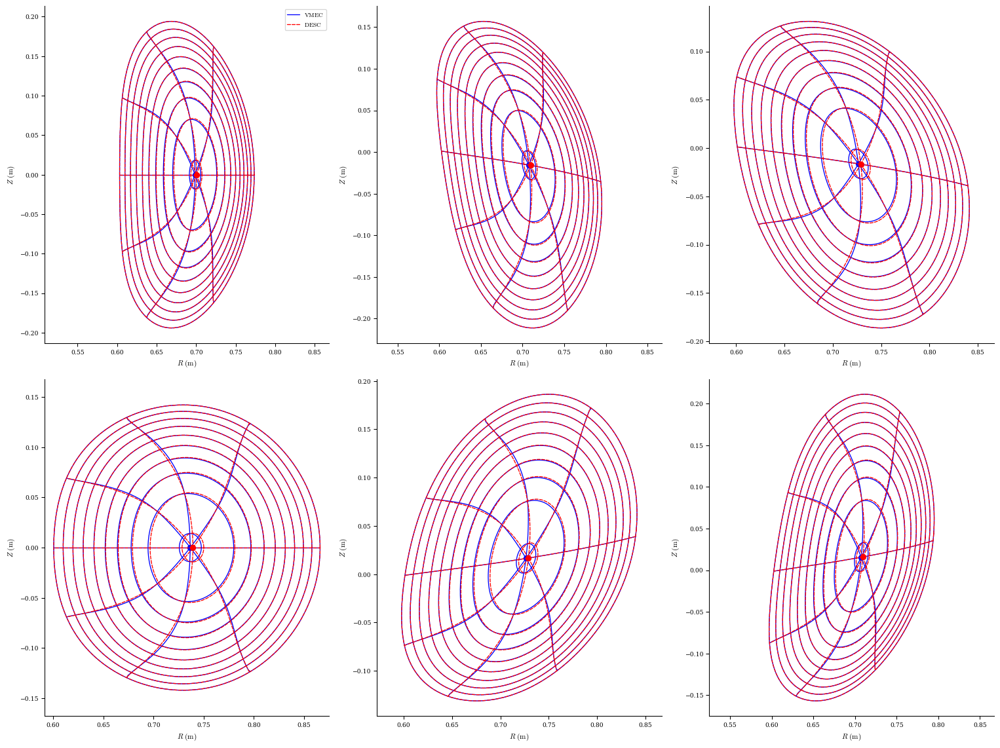

In [6]:
fig, ax = VMECIO.plot_vmec_comparison(veq, "../educational_VMEC/test/wout_test_iota.vmec.nc")

In [31]:
grid = LinearGrid(L=9, M=1, N=1)
data = veq.compute("R", grid=grid)
data = veq.compute("Z", grid=grid, data=data)
phis = np.arange(100)*np.pi/veq.NFP

In [32]:
from desc.magnetic_fields import field_line_integrate
rr, zz = field_line_integrate(data['R'], data['Z'], phis, ext_field)

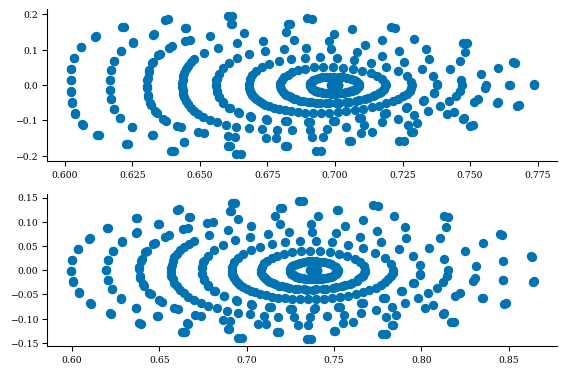

In [33]:
fig, ax = plt.subplots(2)
ax[0].scatter(rr[::2], zz[::2])
# ax[0].scatter(data['R'], data['Z'])
ax[1].scatter(rr[1::2], zz[1::2])

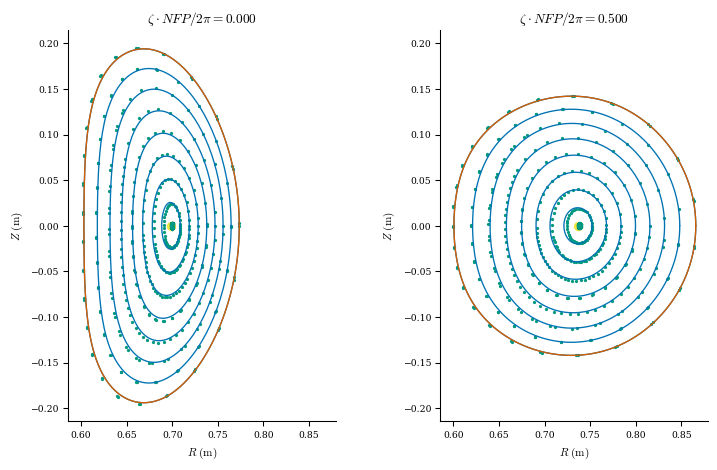

In [34]:
fig, ax = plot_surfaces(veq, theta=0, zeta=phis[:2])
ax[0].scatter(rr[::2], zz[::2], s=2, c=(0.0000, 0.6000, 0.5000))
ax[1].scatter(rr[1::2], zz[1::2], s=2, c=(0.0000, 0.6000, 0.5000))

In [7]:
surf = veq.get_surface_at(1)
surf.change_resolution(M=1, N=0)
eq = Equilibrium(Psi=veq.Psi, pressure=veq.pressure, iota=veq.iota, spectral_indexing=veq.spectral_indexing, sym=veq.sym, NFP=veq.NFP)

In [8]:
surf.R_lmn

DeviceArray([0.70473634, 0.10931209], dtype=float64)

In [9]:
surf.Z_lmn = surf.R_lmn[-1:]

In [10]:
eq.set_initial_guess(surf)
eq.surface = surf


In [11]:
eq.change_resolution(veq.L, veq.M, veq.N, veq.L_grid, veq.M_grid, veq.N_grid)
eq.solve(ftol=1e-2, verbose=3);

Building objective: force
Precomputing transforms
Timer: Precomputing transforms = 290 ms
Timer: Objecive build = 300 ms
Compiling objective function and derivatives
Timer: Objective compilation time = 7.19 sec
Timer: Jacobian compilation time = 16.7 sec
Timer: Total compilation time = 23.9 sec
Factorizing linear constraints
Timer: linear constraint factorize = 552 ms
Starting optimization
   Iteration     Total nfev        Cost      Cost reduction    Step norm     Optimality   
       0              1         7.4132e+06                                    2.54e+10    
       1              4         3.6591e+06      3.75e+06       2.64e-01       3.34e+10    
       2              5         1.1276e+05      3.55e+06       9.10e-02       6.33e+09    
       3              6         4.6881e+03      1.08e+05       4.42e-02       2.04e+09    
       4              8         1.2664e+03      3.42e+03       3.96e-02       4.77e+08    
       5              9         5.2705e+02      7.39e+02     

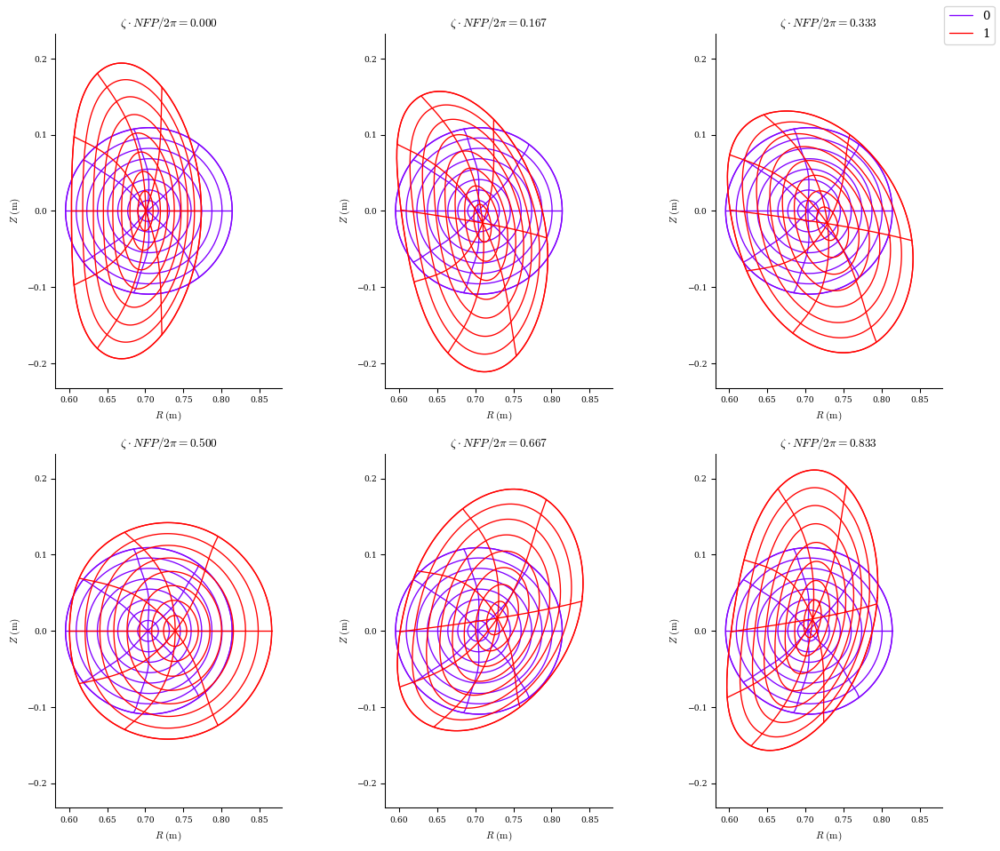

In [12]:
plot_comparison([eq, veq]);

In [13]:
from desc.objectives import ObjectiveFunction, ForceBalance, LambdaGauge, FixPressure, FixIota, FixPsi

bc_objective = BoundaryErrorBS(ext_field)
fb_objective = ForceBalance()

objective = ObjectiveFunction(bc_objective)
constraints = (fb_objective,
               FixPressure(),
               FixIota(),
               FixPsi(),
              )

fb_objective.build(eq)
bc_objective.build(eq)

Precomputing transforms


In [14]:
def print_error_summary(eqis):
    for eqi in eqis:
        f = fb_objective.callback(eqi.R_lmn, eqi.Z_lmn, eqi.L_lmn, eqi.p_l, eqi.i_l, eqi.Psi)
        b = bc_objective.callback(eqi.R_lmn, eqi.Z_lmn, eqi.L_lmn, eqi.p_l, eqi.i_l, eqi.Psi)
    

In [15]:
bc_objective.callback(eq.R_lmn, eq.Z_lmn, eq.L_lmn, eq.p_l, eq.i_l, eq.Psi)
bc_objective.callback(veq.R_lmn, veq.Z_lmn, veq.L_lmn, veq.p_l, veq.i_l, veq.Psi)

Boundary Pressure Imbalance:  2.878e-02 Pa
Boundary Pressure Imbalance:  4.446e-04 Pa


In [ ]:
eq1 = eq.copy()
eq1.optimize(objective, constraints, maxiter=60, verbose=3, xtol=0e-8, 
             options={"perturb_options":{"order":2}, "initial_trust_radius":1e-3, "ga_tr_ratio":0.1});

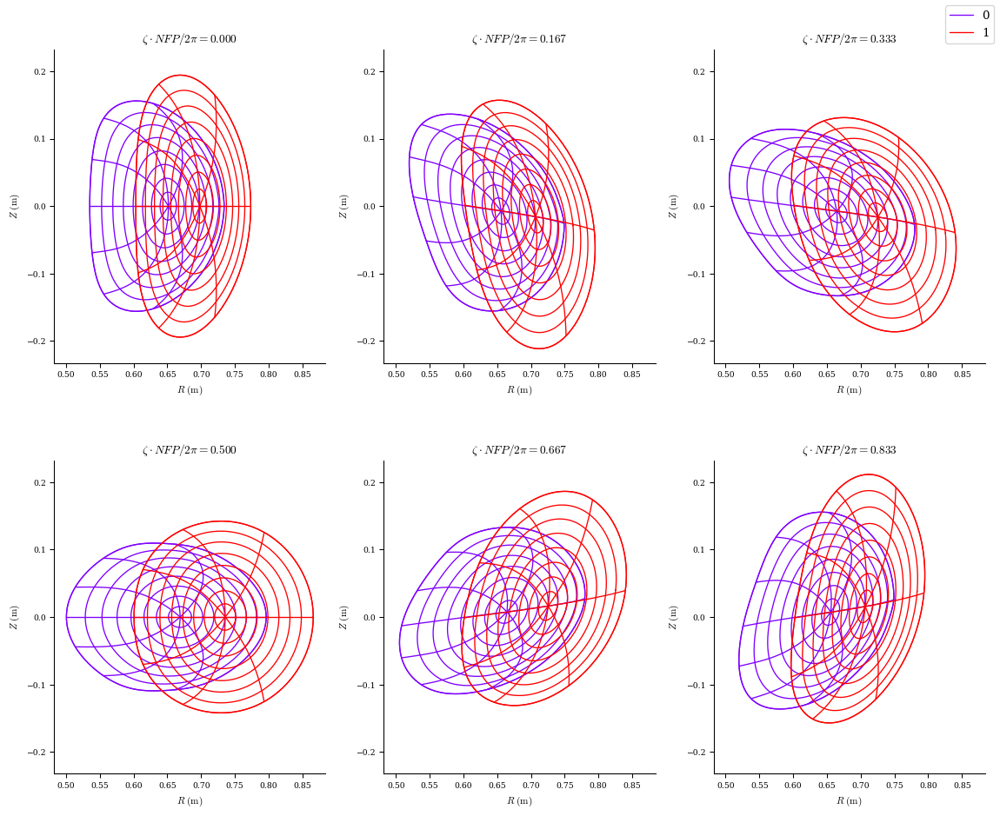

In [20]:
plot_comparison([eq1, veq]);

In [16]:
eq1 = eq.copy()
eq2 = eq1._optimize(objective, ObjectiveFunction(fb_objective), maxiter=60, verbose=3, 
             perturb_options={"order":2, "dZb":True, "dRb":True, "tr_ratio":[0.01, 0.01]});

Building objective: B^2 Boundary
Building objective: force
Precomputing transforms
Total (sum of squares):  7.348e-04, 
Boundary Pressure Imbalance:  3.833e-02 Pa
Optimization Step 1
Trust-Region ratio = 1.000e-02
Perturbing Rb_lmn, Zb_lmn
Computing df
Computing dg
Factoring LHS
Computing d^2f
Computing d^2g
||dc||/||c|| =  1.010e-02
||dx||/||x|| =  1.009e-02
Compiling objective function and derivatives
Factorizing linear constraints
Starting optimization
         Current function value: 2.584e+00
         Iterations: 41
         Function evaluations: 50
         Jacobian evaluations: 42
Start of solver
Total (sum of squares):  7.364e+26, 
Total force:  3.838e+13 (N)
End of solver
Total (sum of squares):  2.584e+00, 
Total force:  2.273e+00 (N)
Total (sum of squares):  3.857e-04, 
Boundary Pressure Imbalance:  2.778e-02 Pa
Predicted Reduction =  3.718e-04
Reduction Ratio = +0.939
Timer: Step 1 time = 5.24 min
Optimization Step 2
Trust-Region ratio = 2.000e-02
Perturbing Rb_lmn, Zb_lmn


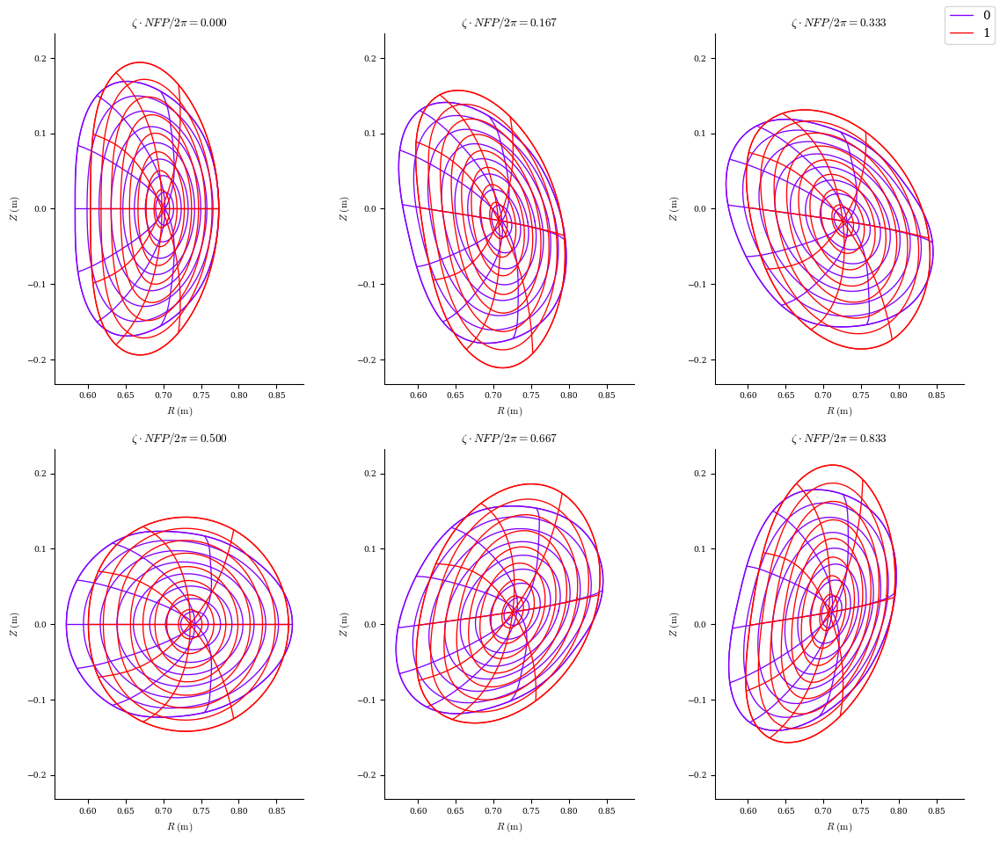

In [17]:
plot_comparison([eq2, veq]);

In [16]:
bc_objective1 = ObjectiveFunction(bc_objective)
fb_objective1 = ObjectiveFunction(fb_objective)

In [17]:
eqs = [eq]
from desc.perturbations import optimal_perturb
eq_temp = optimal_perturb(
    eqs[-1],
    fb_objective1,
    bc_objective1,
    dRb=True,
    dZb=True,
    order=2,
    tr_ratio=[0.05, 0.05],
    verbose=3,
    copy=True,)
eqs.append(eq_temp[0])
eqs[-1].solve(objective=fb_objective1, maxiter=50);

Building objective: force
Precomputing transforms
Timer: Precomputing transforms = 275 ms
Timer: Objecive build = 283 ms
Building objective: B^2 Boundary
Timer: Objecive build = 269 ms
Perturbing Rb_lmn, Zb_lmn
Computing df
Timer: df computation = 21.1 sec
Computing dg
Timer: dg computation = 6.80 min
Factoring LHS
Timer: LHS factorization = 136 ms
Computing d^2f
Timer: d^2f computation = 35.2 sec
Computing d^2g
Timer: d^2g computation = 49.8 sec
||dc||/||c|| =  5.156e-02
||dx||/||x|| =  5.105e-02
Timer: Total perturbation = 9.11 min
Compiling objective function and derivatives
Factorizing linear constraints
Starting optimization
Optimization terminated successfully.
`ftol` condition satisfied.
         Current function value: 2.832e+00
         Iterations: 10
         Function evaluations: 11
         Jacobian evaluations: 11
Start of solver
Total (sum of squares):  6.880e+15, 
Total force:  1.173e+08 (N)
End of solver
Total (sum of squares):  2.832e+00, 
Total force:  2.380e+00 (N)


In [18]:
print_error_summary(eqs)

Total force:  3.156e+01 (N)
Boundary Pressure Imbalance:  2.878e-02 Pa
Total force:  5.204e+01 (N)
Boundary Pressure Imbalance:  6.064e-03 Pa


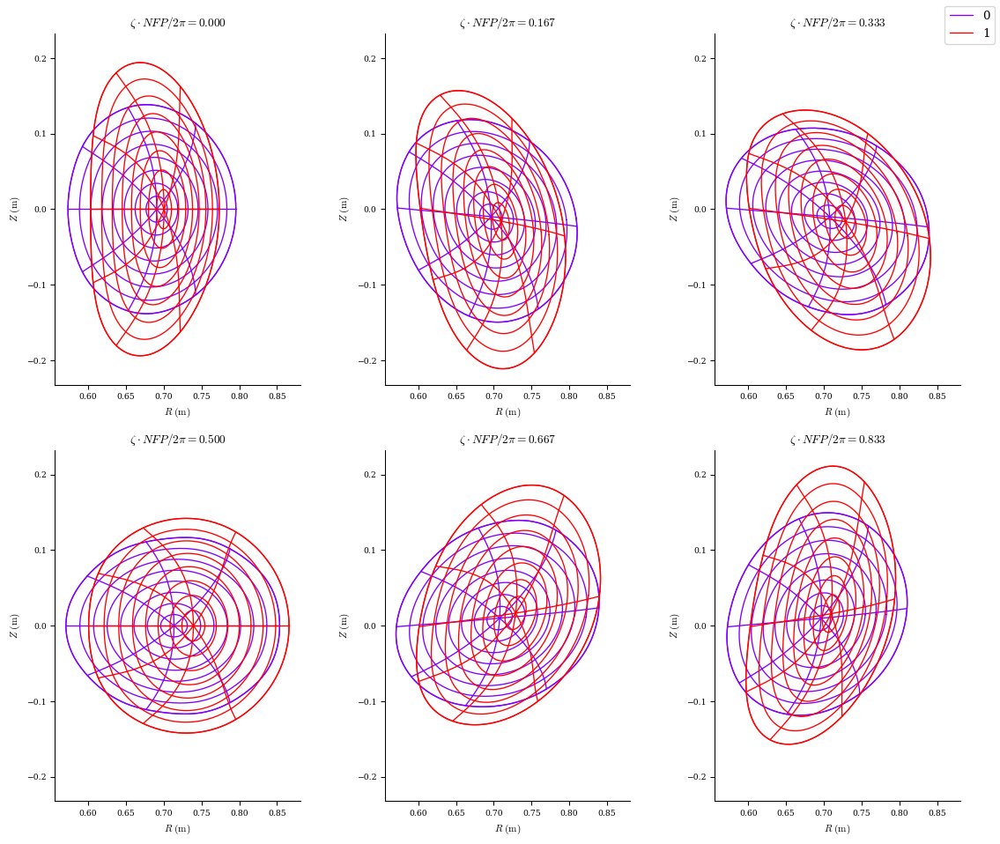

In [19]:
plot_comparison([eqs[-1]] + [veq]);

In [20]:
eq_temp = optimal_perturb(
    eqs[-1],
    fb_objective1,
    bc_objective1,
    dRb=True,
    dZb=True,
    order=2,
    tr_ratio=[0.05, 0.05],
    verbose=3,
    copy=True,)
eqs.append(eq_temp[0])
eqs[-1].solve(objective=fb_objective1, maxiter=50);

Perturbing Rb_lmn, Zb_lmn
Computing df
Timer: df computation = 5.96 sec
Computing dg
Timer: dg computation = 6.22 min
Factoring LHS
Timer: LHS factorization = 153 ms
Computing d^2f
Timer: d^2f computation = 206 ms
Computing d^2g
Timer: d^2g computation = 2.13 sec
||dc||/||c|| =  5.028e-02
||dx||/||x|| =  5.033e-02
Timer: Total perturbation = 6.48 min
Factorizing linear constraints
Starting optimization
Optimization terminated successfully.
`ftol` condition satisfied.
         Current function value: 1.369e+04
         Iterations: 7
         Function evaluations: 11
         Jacobian evaluations: 8
Start of solver
Total (sum of squares):  2.246e+18, 
Total force:  2.120e+09 (N)
End of solver
Total (sum of squares):  1.369e+04, 
Total force:  1.655e+02 (N)


In [21]:
print_error_summary(eqs)

Total force:  3.156e+01 (N)
Boundary Pressure Imbalance:  2.878e-02 Pa
Total force:  5.204e+01 (N)
Boundary Pressure Imbalance:  6.064e-03 Pa
Total force:  2.180e+02 (N)
Boundary Pressure Imbalance:  1.454e-03 Pa


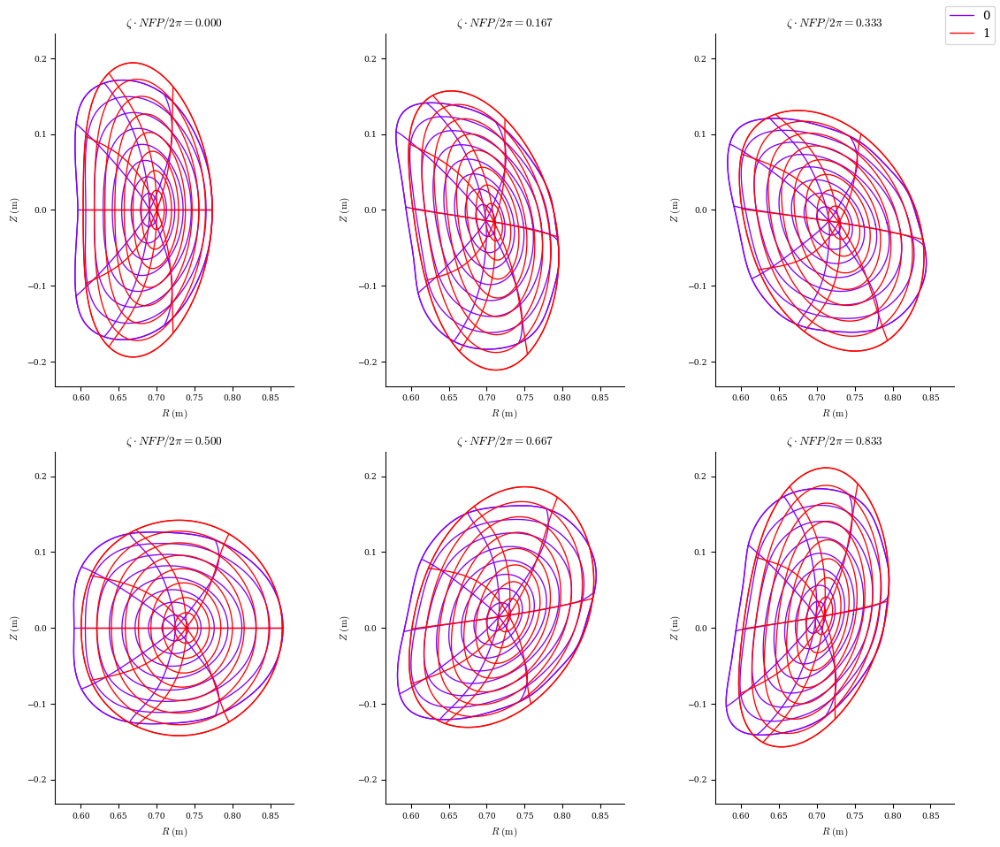

In [22]:
plot_comparison([eqs[-1]] + [veq]);

In [23]:
eq_temp = optimal_perturb(
    eqs[-1],
    fb_objective1,
    bc_objective1,
    dRb=True,
    dZb=True,
    order=2,
    tr_ratio=[0.05, 0.05],
    verbose=3,
    copy=True,)
eqs.append(eq_temp[0])
eqs[-1].solve(objective=fb_objective1, maxiter=50);

Perturbing Rb_lmn, Zb_lmn
Computing df
Timer: df computation = 5.85 sec
Computing dg
Timer: dg computation = 6.23 min
Factoring LHS
Timer: LHS factorization = 122 ms
Computing d^2f
Timer: d^2f computation = 170 ms
Computing d^2g
Timer: d^2g computation = 1.90 sec
||dc||/||c|| =  3.477e-02
||dx||/||x|| =  4.959e-02
Timer: Total perturbation = 6.47 min
Factorizing linear constraints
Starting optimization
Optimization terminated successfully.
`ftol` condition satisfied.
         Current function value: 3.144e+02
         Iterations: 12
         Function evaluations: 18
         Jacobian evaluations: 13
Start of solver
Total (sum of squares):  3.108e+24, 
Total force:  2.493e+12 (N)
End of solver
Total (sum of squares):  3.144e+02, 
Total force:  2.508e+01 (N)


In [24]:
print_error_summary(eqs)

Total force:  3.156e+01 (N)
Boundary Pressure Imbalance:  2.878e-02 Pa
Total force:  5.204e+01 (N)
Boundary Pressure Imbalance:  6.064e-03 Pa
Total force:  2.180e+02 (N)
Boundary Pressure Imbalance:  1.454e-03 Pa
Total force:  1.445e+02 (N)
Boundary Pressure Imbalance:  2.614e-04 Pa


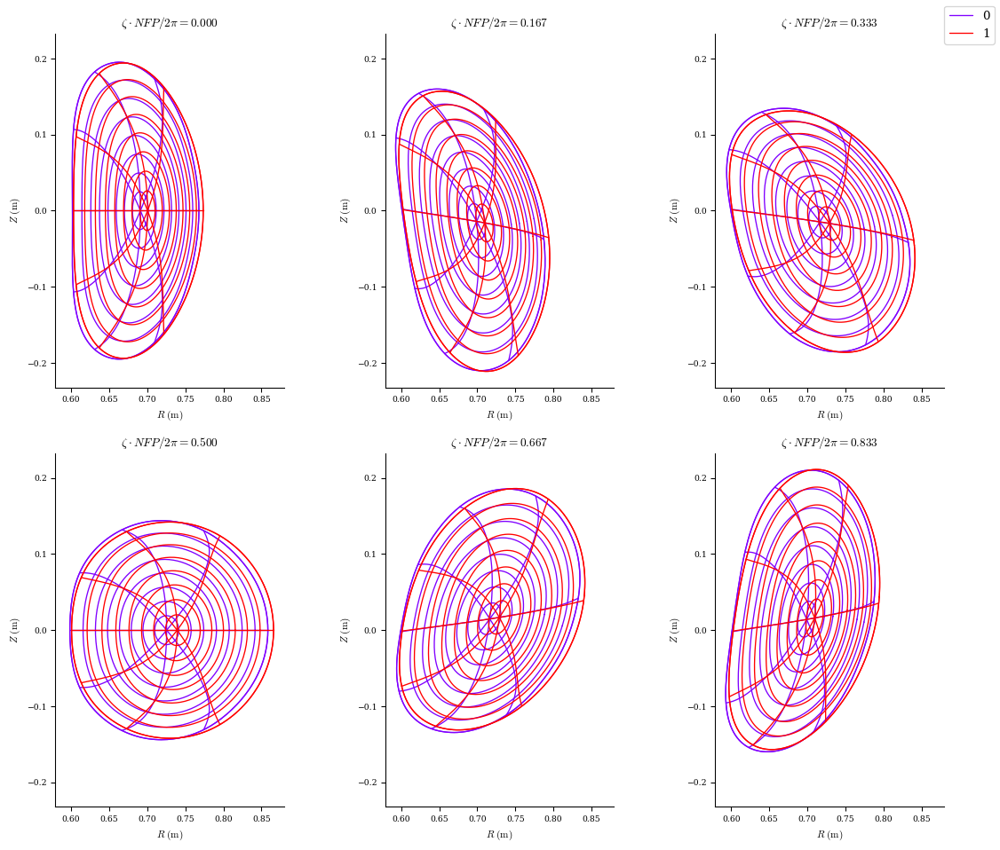

In [25]:
plot_comparison([eqs[-1]] + [veq]);

In [26]:
eq_temp = optimal_perturb(
    eqs[-1],
    fb_objective1,
    bc_objective1,
    dRb=True,
    dZb=True,
    order=2,
    tr_ratio=[0.05, 0.05],
    verbose=3,
    copy=True,)
eqs.append(eq_temp[0])
eqs[-1].solve(objective=fb_objective1, maxiter=50);

Perturbing Rb_lmn, Zb_lmn
Computing df
Timer: df computation = 5.82 sec
Computing dg
Timer: dg computation = 6.23 min
Factoring LHS
Timer: LHS factorization = 119 ms
Computing d^2f
Timer: d^2f computation = 218 ms
Computing d^2g
Timer: d^2g computation = 2.04 sec
||dc||/||c|| =  3.524e-02
||dx||/||x|| =  4.959e-02
Timer: Total perturbation = 6.48 min
Factorizing linear constraints
Starting optimization
Optimization terminated successfully.
`ftol` condition satisfied.
         Current function value: 3.187e+02
         Iterations: 7
         Function evaluations: 11
         Jacobian evaluations: 8
Start of solver
Total (sum of squares):  1.473e+14, 
Total force:  1.716e+07 (N)
End of solver
Total (sum of squares):  3.187e+02, 
Total force:  2.525e+01 (N)


In [27]:
print_error_summary(eqs)

Total force:  3.156e+01 (N)
Boundary Pressure Imbalance:  2.878e-02 Pa
Total force:  5.204e+01 (N)
Boundary Pressure Imbalance:  6.064e-03 Pa
Total force:  2.180e+02 (N)
Boundary Pressure Imbalance:  1.454e-03 Pa
Total force:  1.445e+02 (N)
Boundary Pressure Imbalance:  2.614e-04 Pa
Total force:  1.263e+02 (N)
Boundary Pressure Imbalance:  4.826e-04 Pa


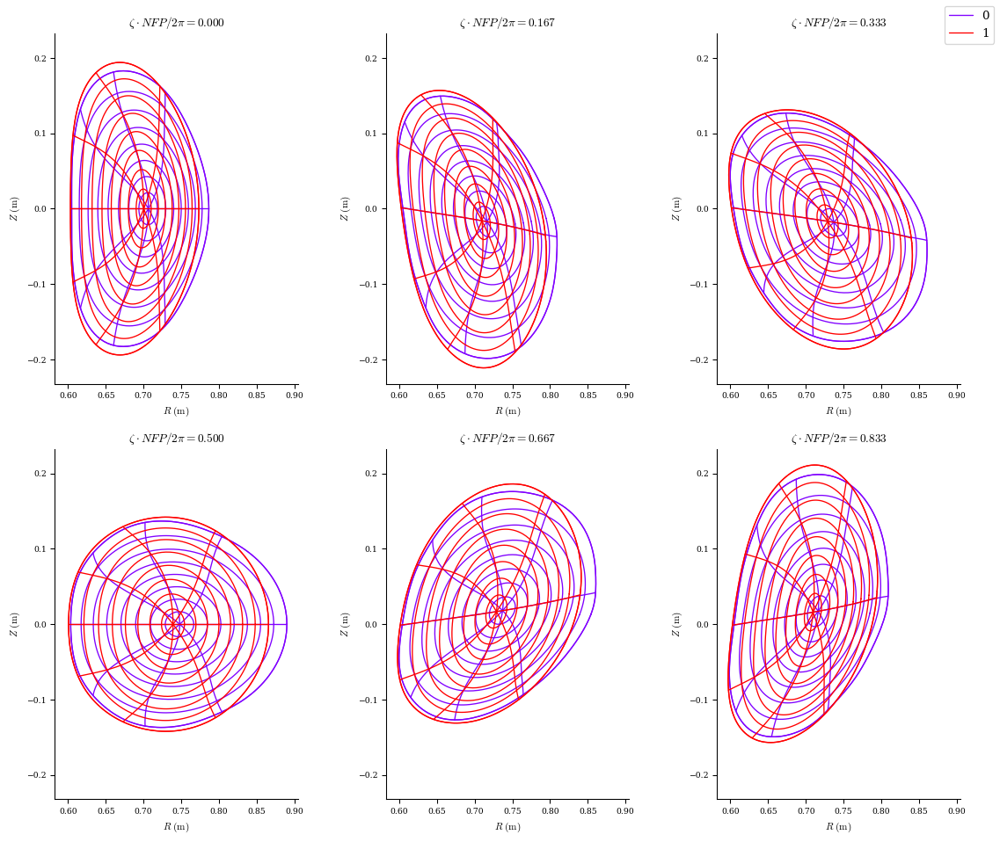

In [28]:
plot_comparison([eqs[-1]] + [veq]);

In [29]:
eq_temp = optimal_perturb(
    eqs[-1],
    fb_objective1,
    bc_objective1,
    dRb=True,
    dZb=True,
    order=2,
    tr_ratio=[0.05, 0.05],
    verbose=3,
    copy=True,)
eqs.append(eq_temp[0])
eqs[-1].solve(objective=fb_objective1, maxiter=50);

Perturbing Rb_lmn, Zb_lmn
Computing df
Timer: df computation = 5.80 sec
Computing dg
Timer: dg computation = 6.26 min
Factoring LHS
Timer: LHS factorization = 125 ms
Computing d^2f
Timer: d^2f computation = 179 ms
Computing d^2g
Timer: d^2g computation = 1.98 sec
||dc||/||c|| =  3.117e-02
||dx||/||x|| =  5.008e-02
Timer: Total perturbation = 6.51 min
Factorizing linear constraints
Starting optimization
Optimization terminated successfully.
`ftol` condition satisfied.
         Current function value: 1.177e+03
         Iterations: 7
         Function evaluations: 12
         Jacobian evaluations: 8
Start of solver
Total (sum of squares):  1.173e+22, 
Total force:  1.532e+11 (N)
End of solver
Total (sum of squares):  1.177e+03, 
Total force:  4.851e+01 (N)


In [30]:
print_error_summary(eqs)

Total force:  3.156e+01 (N)
Boundary Pressure Imbalance:  2.878e-02 Pa
Total force:  5.204e+01 (N)
Boundary Pressure Imbalance:  6.064e-03 Pa
Total force:  2.180e+02 (N)
Boundary Pressure Imbalance:  1.454e-03 Pa
Total force:  1.445e+02 (N)
Boundary Pressure Imbalance:  2.614e-04 Pa
Total force:  1.263e+02 (N)
Boundary Pressure Imbalance:  4.826e-04 Pa
Total force:  1.546e+02 (N)
Boundary Pressure Imbalance:  3.709e-04 Pa


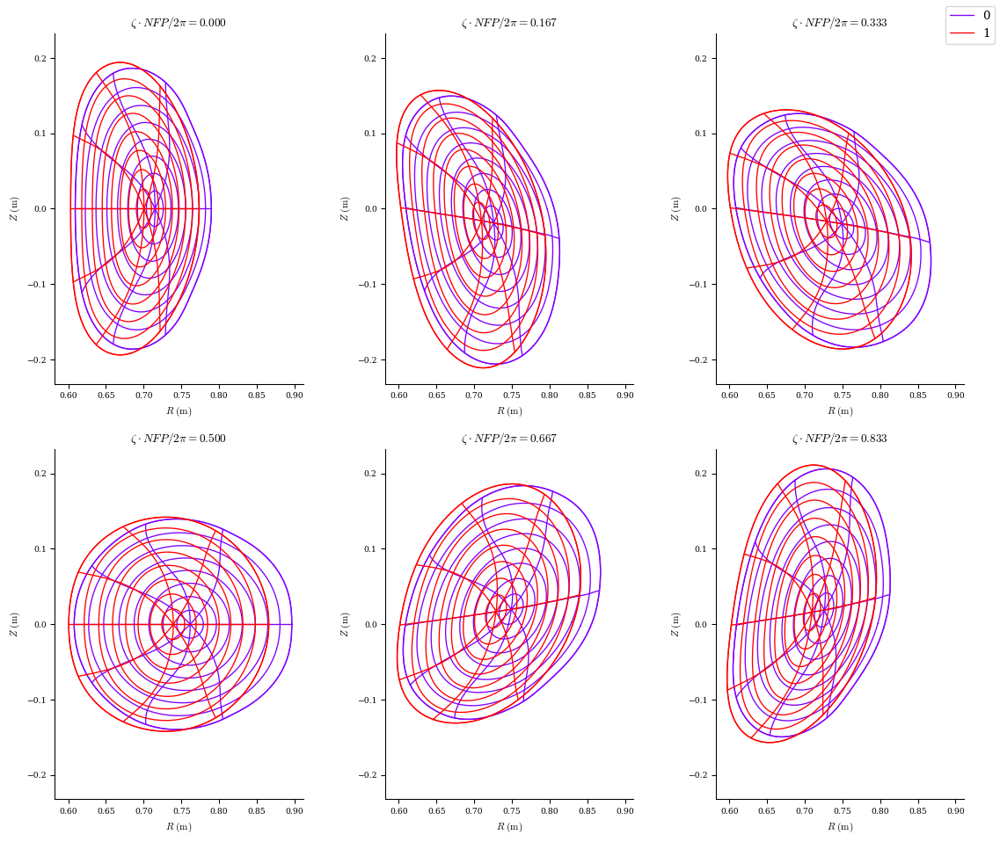

In [31]:
plot_comparison([eqs[-1]] + [veq]);

In [32]:
eq_temp = optimal_perturb(
    eqs[-1],
    fb_objective1,
    bc_objective1,
    dRb=True,
    dZb=True,
    order=2,
    tr_ratio=[0.05, 0.05],
    verbose=3,
    copy=True,)
eqs.append(eq_temp[0])
eqs[-1].solve(objective=fb_objective1, maxiter=50);

Perturbing Rb_lmn, Zb_lmn
Computing df
Timer: df computation = 5.65 sec
Computing dg
Timer: dg computation = 6.27 min
Factoring LHS
Timer: LHS factorization = 121 ms
Computing d^2f
Timer: d^2f computation = 217 ms
Computing d^2g
Timer: d^2g computation = 2.07 sec
||dc||/||c|| =  2.064e-02
||dx||/||x|| =  4.968e-02
Timer: Total perturbation = 6.52 min
Factorizing linear constraints
Starting optimization
Optimization terminated successfully.
`ftol` condition satisfied.
         Current function value: 3.521e+02
         Iterations: 8
         Function evaluations: 10
         Jacobian evaluations: 9
Start of solver
Total (sum of squares):  3.483e+22, 
Total force:  2.639e+11 (N)
End of solver
Total (sum of squares):  3.521e+02, 
Total force:  2.654e+01 (N)


In [33]:
print_error_summary(eqs)

Total force:  3.156e+01 (N)
Boundary Pressure Imbalance:  2.878e-02 Pa
Total force:  5.204e+01 (N)
Boundary Pressure Imbalance:  6.064e-03 Pa
Total force:  2.180e+02 (N)
Boundary Pressure Imbalance:  1.454e-03 Pa
Total force:  1.445e+02 (N)
Boundary Pressure Imbalance:  2.614e-04 Pa
Total force:  1.263e+02 (N)
Boundary Pressure Imbalance:  4.826e-04 Pa
Total force:  1.546e+02 (N)
Boundary Pressure Imbalance:  3.709e-04 Pa
Total force:  1.836e+02 (N)
Boundary Pressure Imbalance:  3.089e-04 Pa


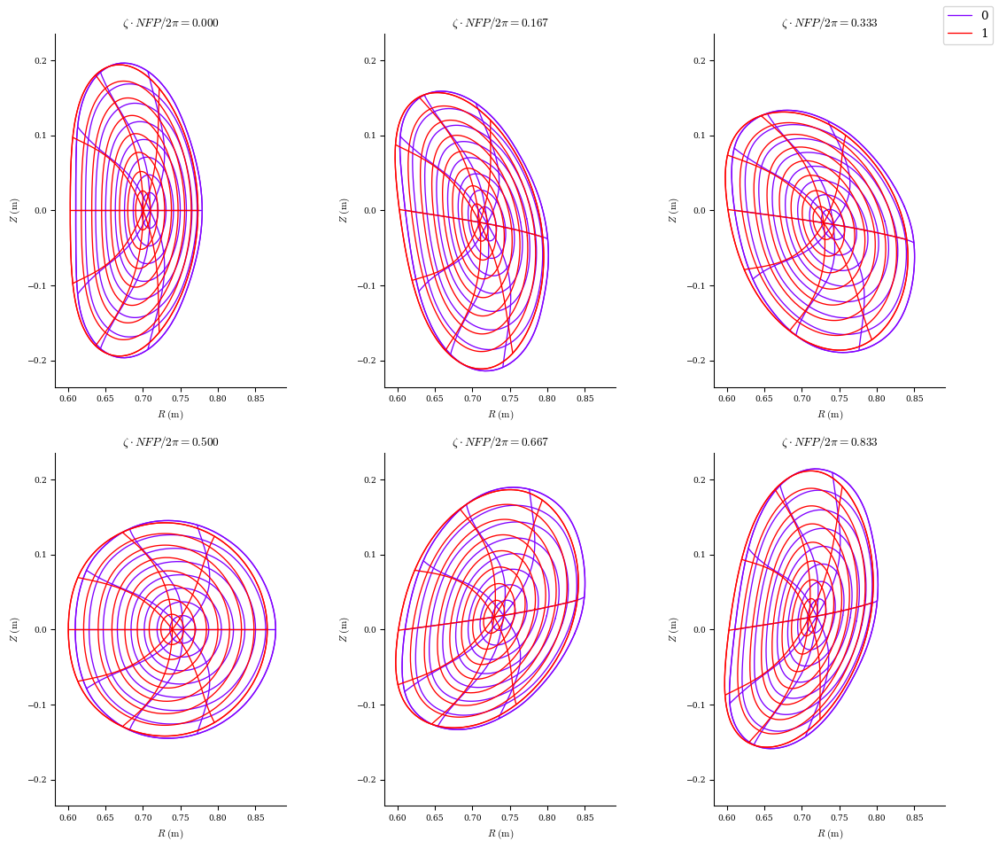

In [34]:
plot_comparison([eqs[-1]] + [veq]);

In [35]:
eq_temp = optimal_perturb(
    eqs[-1],
    fb_objective1,
    bc_objective1,
    dRb=True,
    dZb=True,
    order=2,
    tr_ratio=[0.05, 0.05],
    verbose=3,
    copy=True,)
eqs.append(eq_temp[0])
eqs[-1].solve(objective=fb_objective1, maxiter=50);

Perturbing Rb_lmn, Zb_lmn
Computing df
Timer: df computation = 5.81 sec
Computing dg
Timer: dg computation = 6.33 min
Factoring LHS
Timer: LHS factorization = 118 ms
Computing d^2f
Timer: d^2f computation = 202 ms
Computing d^2g
Timer: d^2g computation = 2.03 sec
||dc||/||c|| =  2.365e-02
||dx||/||x|| =  5.009e-02
Timer: Total perturbation = 6.57 min
Factorizing linear constraints
Starting optimization
Optimization terminated successfully.
`ftol` condition satisfied.
         Current function value: 3.549e+02
         Iterations: 6
         Function evaluations: 11
         Jacobian evaluations: 7
Start of solver
Total (sum of squares):  1.779e+35, 
Total force:  5.965e+17 (N)
End of solver
Total (sum of squares):  3.549e+02, 
Total force:  2.664e+01 (N)


In [36]:
print_error_summary(eqs)

Total force:  3.156e+01 (N)
Boundary Pressure Imbalance:  2.878e-02 Pa
Total force:  5.204e+01 (N)
Boundary Pressure Imbalance:  6.064e-03 Pa
Total force:  2.180e+02 (N)
Boundary Pressure Imbalance:  1.454e-03 Pa
Total force:  1.445e+02 (N)
Boundary Pressure Imbalance:  2.614e-04 Pa
Total force:  1.263e+02 (N)
Boundary Pressure Imbalance:  4.826e-04 Pa
Total force:  1.546e+02 (N)
Boundary Pressure Imbalance:  3.709e-04 Pa
Total force:  1.836e+02 (N)
Boundary Pressure Imbalance:  3.089e-04 Pa
Total force:  1.381e+02 (N)
Boundary Pressure Imbalance:  2.029e-04 Pa


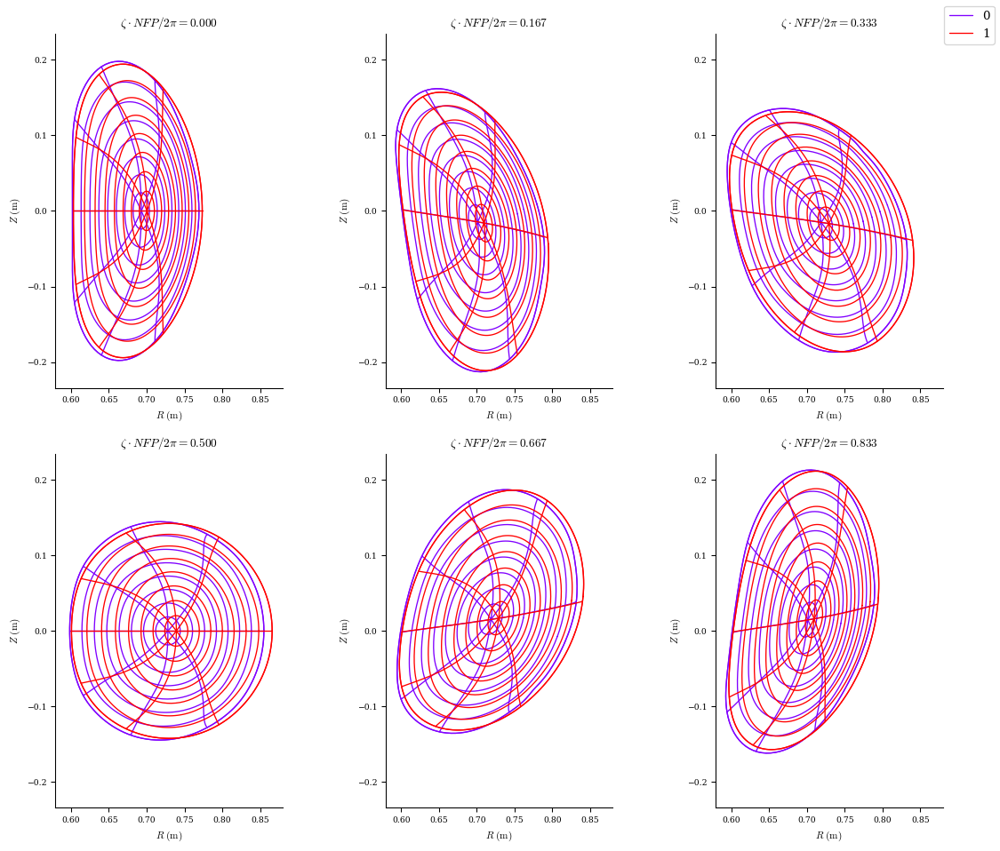

In [37]:
plot_comparison([eqs[-1]] + [veq]);

In [38]:
eq_temp = optimal_perturb(
    eqs[-1],
    fb_objective1,
    bc_objective1,
    dRb=True,
    dZb=True,
    order=2,
    tr_ratio=[0.05, 0.05],
    verbose=3,
    copy=True,)
eqs.append(eq_temp[0])
eqs[-1].solve(objective=fb_objective1, maxiter=50);

Perturbing Rb_lmn, Zb_lmn
Computing df
Timer: df computation = 5.86 sec
Computing dg
Timer: dg computation = 6.31 min
Factoring LHS
Timer: LHS factorization = 111 ms
Computing d^2f
Timer: d^2f computation = 173 ms
Computing d^2g
Timer: d^2g computation = 1.99 sec
||dc||/||c|| =  2.026e-02
||dx||/||x|| =  5.018e-02
Timer: Total perturbation = 6.56 min
Factorizing linear constraints
Starting optimization
Optimization terminated successfully.
`ftol` condition satisfied.
         Current function value: 2.784e+02
         Iterations: 8
         Function evaluations: 11
         Jacobian evaluations: 9
Start of solver
Total (sum of squares):  1.996e+13, 
Total force:  6.318e+06 (N)
End of solver
Total (sum of squares):  2.784e+02, 
Total force:  2.360e+01 (N)


In [39]:
print_error_summary(eqs)

Total force:  3.156e+01 (N)
Boundary Pressure Imbalance:  2.878e-02 Pa
Total force:  5.204e+01 (N)
Boundary Pressure Imbalance:  6.064e-03 Pa
Total force:  2.180e+02 (N)
Boundary Pressure Imbalance:  1.454e-03 Pa
Total force:  1.445e+02 (N)
Boundary Pressure Imbalance:  2.614e-04 Pa
Total force:  1.263e+02 (N)
Boundary Pressure Imbalance:  4.826e-04 Pa
Total force:  1.546e+02 (N)
Boundary Pressure Imbalance:  3.709e-04 Pa
Total force:  1.836e+02 (N)
Boundary Pressure Imbalance:  3.089e-04 Pa
Total force:  1.381e+02 (N)
Boundary Pressure Imbalance:  2.029e-04 Pa
Total force:  1.408e+02 (N)
Boundary Pressure Imbalance:  2.312e-04 Pa


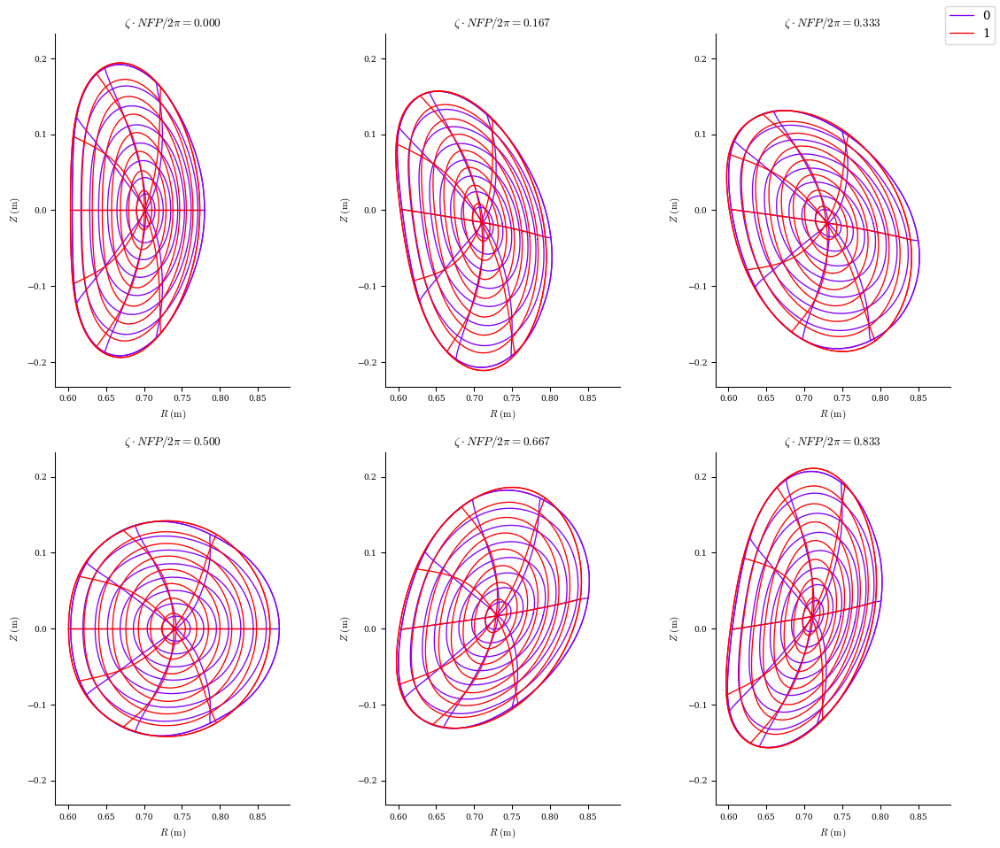

In [40]:
plot_comparison([eqs[-1]] + [veq]);

In [41]:
eq_temp = optimal_perturb(
    eqs[-1],
    fb_objective1,
    bc_objective1,
    dRb=True,
    dZb=True,
    order=2,
    tr_ratio=[0.05, 0.05],
    verbose=3,
    copy=True,)
eqs.append(eq_temp[0])
eqs[-1].solve(objective=fb_objective1, maxiter=50);

Perturbing Rb_lmn, Zb_lmn
Computing df
Timer: df computation = 6.21 sec
Computing dg
Timer: dg computation = 6.36 min
Factoring LHS
Timer: LHS factorization = 122 ms
Computing d^2f
Timer: d^2f computation = 181 ms
Computing d^2g
Timer: d^2g computation = 2.36 sec
||dc||/||c|| =  9.892e-03
||dx||/||x|| =  5.002e-02
Timer: Total perturbation = 6.63 min
Factorizing linear constraints
Starting optimization
Optimization terminated successfully.
`ftol` condition satisfied.
         Current function value: 1.407e+02
         Iterations: 6
         Function evaluations: 9
         Jacobian evaluations: 7
Start of solver
Total (sum of squares):  9.781e+19, 
Total force:  1.399e+10 (N)
End of solver
Total (sum of squares):  1.407e+02, 
Total force:  1.677e+01 (N)


In [42]:
print_error_summary(eqs)

Total force:  3.156e+01 (N)
Boundary Pressure Imbalance:  2.878e-02 Pa
Total force:  5.204e+01 (N)
Boundary Pressure Imbalance:  6.064e-03 Pa
Total force:  2.180e+02 (N)
Boundary Pressure Imbalance:  1.454e-03 Pa
Total force:  1.445e+02 (N)
Boundary Pressure Imbalance:  2.614e-04 Pa
Total force:  1.263e+02 (N)
Boundary Pressure Imbalance:  4.826e-04 Pa
Total force:  1.546e+02 (N)
Boundary Pressure Imbalance:  3.709e-04 Pa
Total force:  1.836e+02 (N)
Boundary Pressure Imbalance:  3.089e-04 Pa
Total force:  1.381e+02 (N)
Boundary Pressure Imbalance:  2.029e-04 Pa
Total force:  1.408e+02 (N)
Boundary Pressure Imbalance:  2.312e-04 Pa
Total force:  1.479e+02 (N)
Boundary Pressure Imbalance:  1.373e-04 Pa


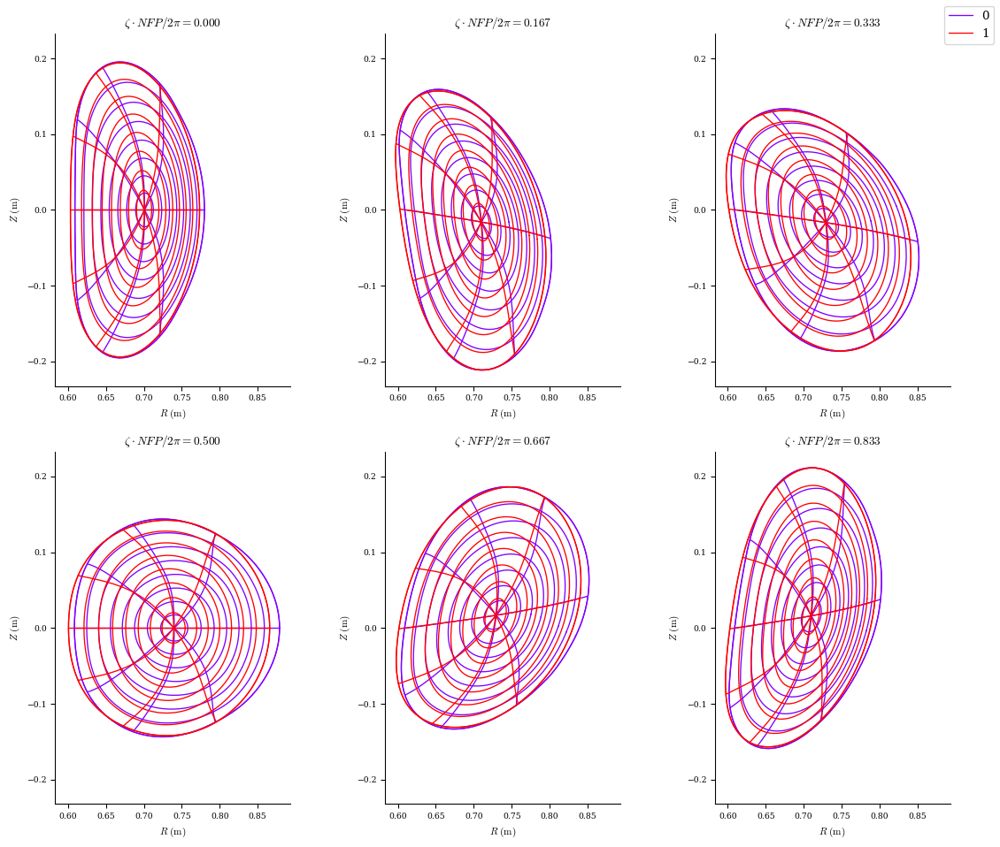

In [43]:
plot_comparison([eqs[-1]] + [veq]);

In [44]:
eq_temp = optimal_perturb(
    eqs[-1],
    fb_objective1,
    bc_objective1,
    dRb=True,
    dZb=True,
    order=2,
    tr_ratio=[0.05, 0.05],
    verbose=3,
    copy=True,)
eqs.append(eq_temp[0])
eqs[-1].solve(objective=fb_objective1, maxiter=50);

Perturbing Rb_lmn, Zb_lmn
Computing df
Timer: df computation = 5.84 sec
Computing dg
Timer: dg computation = 6.32 min
Factoring LHS
Timer: LHS factorization = 118 ms
Computing d^2f
Timer: d^2f computation = 189 ms
Computing d^2g
Timer: d^2g computation = 2.02 sec
||dc||/||c|| =  9.886e-03
||dx||/||x|| =  5.004e-02
Timer: Total perturbation = 6.57 min
Factorizing linear constraints
Starting optimization
Optimization terminated successfully.
`ftol` condition satisfied.
         Current function value: 1.972e+02
         Iterations: 6
         Function evaluations: 10
         Jacobian evaluations: 7
Start of solver
Total (sum of squares):  4.285e+11, 
Total force:  9.257e+05 (N)
End of solver
Total (sum of squares):  1.972e+02, 
Total force:  1.986e+01 (N)


In [45]:
print_error_summary(eqs)

Total force:  3.156e+01 (N)
Boundary Pressure Imbalance:  2.878e-02 Pa
Total force:  5.204e+01 (N)
Boundary Pressure Imbalance:  6.064e-03 Pa
Total force:  2.180e+02 (N)
Boundary Pressure Imbalance:  1.454e-03 Pa
Total force:  1.445e+02 (N)
Boundary Pressure Imbalance:  2.614e-04 Pa
Total force:  1.263e+02 (N)
Boundary Pressure Imbalance:  4.826e-04 Pa
Total force:  1.546e+02 (N)
Boundary Pressure Imbalance:  3.709e-04 Pa
Total force:  1.836e+02 (N)
Boundary Pressure Imbalance:  3.089e-04 Pa
Total force:  1.381e+02 (N)
Boundary Pressure Imbalance:  2.029e-04 Pa
Total force:  1.408e+02 (N)
Boundary Pressure Imbalance:  2.312e-04 Pa
Total force:  1.479e+02 (N)
Boundary Pressure Imbalance:  1.373e-04 Pa
Total force:  1.402e+02 (N)
Boundary Pressure Imbalance:  1.184e-04 Pa


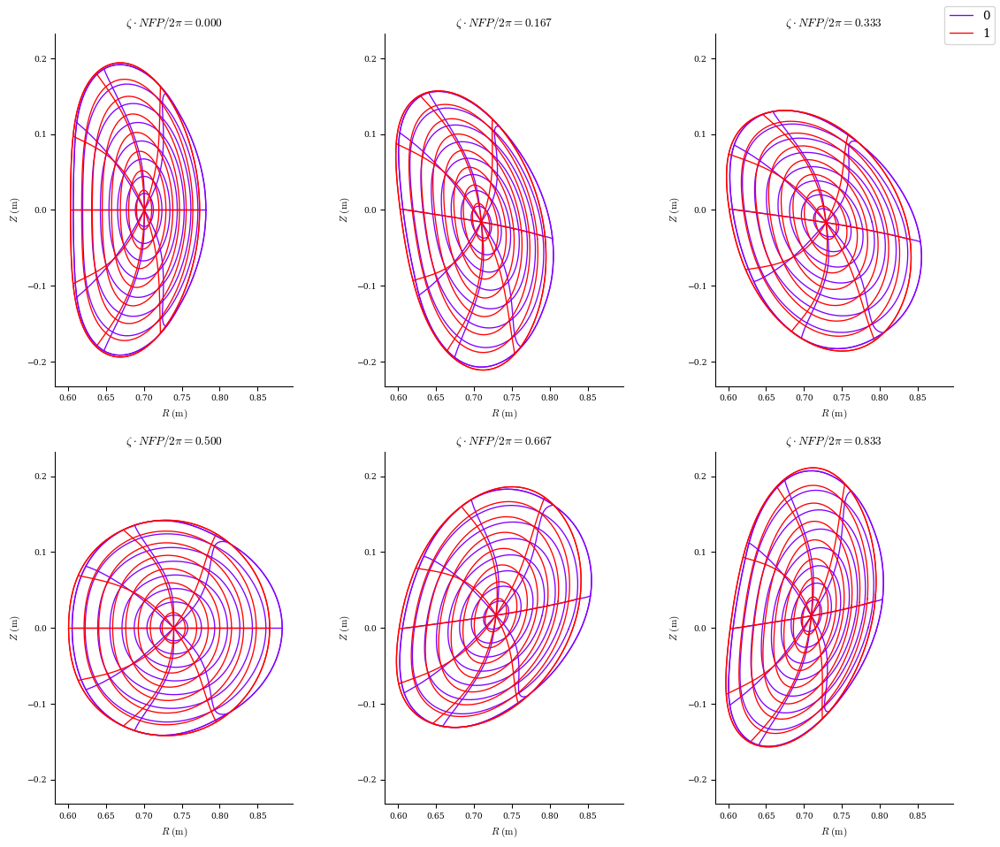

In [46]:
plot_comparison([eqs[-1]] + [veq]);

In [47]:
eq_temp = optimal_perturb(
    eqs[-1],
    fb_objective1,
    bc_objective1,
    dRb=True,
    dZb=True,
    order=2,
    tr_ratio=[0.05, 0.05],
    verbose=3,
    copy=True,)
eqs.append(eq_temp[0])
eqs[-1].solve(objective=fb_objective1, maxiter=50);

Perturbing Rb_lmn, Zb_lmn
Computing df
Timer: df computation = 5.78 sec
Computing dg
Timer: dg computation = 6.31 min
Factoring LHS
Timer: LHS factorization = 136 ms
Computing d^2f
Timer: d^2f computation = 180 ms
Computing d^2g
Timer: d^2g computation = 2.08 sec
||dc||/||c|| =  6.266e-03
||dx||/||x|| =  4.610e-02
Timer: Total perturbation = 6.56 min
Factorizing linear constraints
Starting optimization
Optimization terminated successfully.
`ftol` condition satisfied.
         Current function value: 9.521e+01
         Iterations: 8
         Function evaluations: 10
         Jacobian evaluations: 9
Start of solver
Total (sum of squares):  7.644e+07, 
Total force:  1.236e+04 (N)
End of solver
Total (sum of squares):  9.521e+01, 
Total force:  1.380e+01 (N)


In [48]:
print_error_summary(eqs)

Total force:  3.156e+01 (N)
Boundary Pressure Imbalance:  2.878e-02 Pa
Total force:  5.204e+01 (N)
Boundary Pressure Imbalance:  6.064e-03 Pa
Total force:  2.180e+02 (N)
Boundary Pressure Imbalance:  1.454e-03 Pa
Total force:  1.445e+02 (N)
Boundary Pressure Imbalance:  2.614e-04 Pa
Total force:  1.263e+02 (N)
Boundary Pressure Imbalance:  4.826e-04 Pa
Total force:  1.546e+02 (N)
Boundary Pressure Imbalance:  3.709e-04 Pa
Total force:  1.836e+02 (N)
Boundary Pressure Imbalance:  3.089e-04 Pa
Total force:  1.381e+02 (N)
Boundary Pressure Imbalance:  2.029e-04 Pa
Total force:  1.408e+02 (N)
Boundary Pressure Imbalance:  2.312e-04 Pa
Total force:  1.479e+02 (N)
Boundary Pressure Imbalance:  1.373e-04 Pa
Total force:  1.402e+02 (N)
Boundary Pressure Imbalance:  1.184e-04 Pa
Total force:  1.432e+02 (N)
Boundary Pressure Imbalance:  1.134e-04 Pa


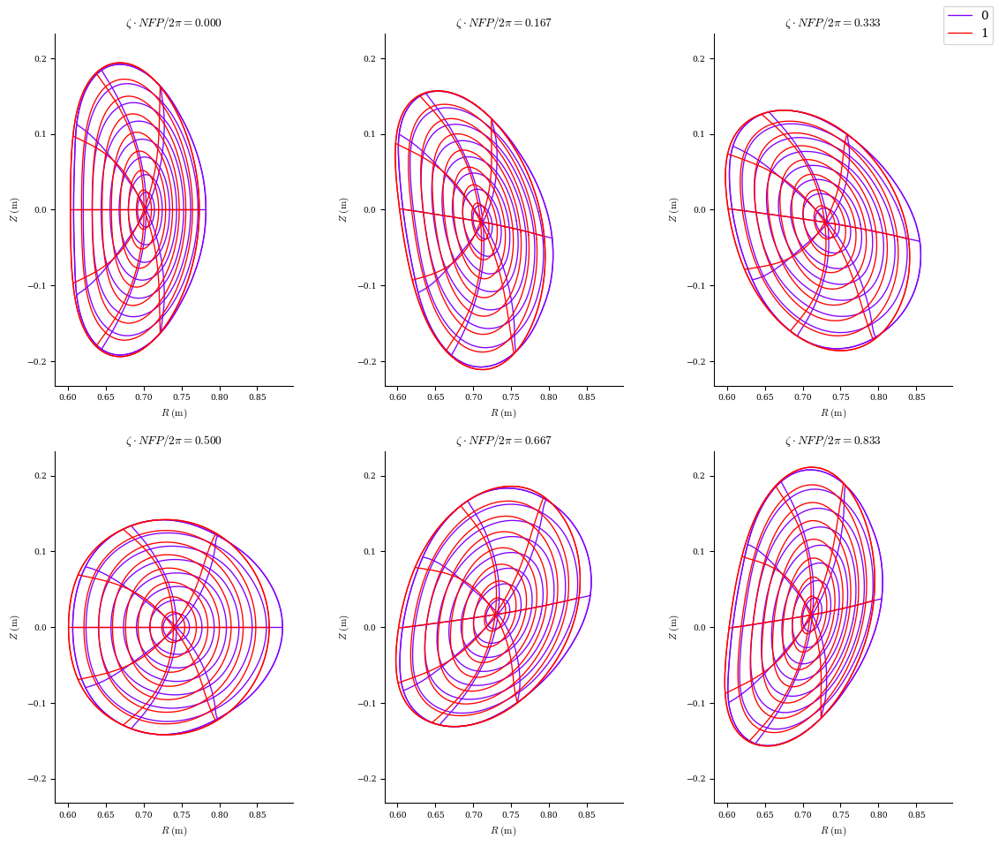

In [49]:
plot_comparison([eqs[-1]] + [veq]);

In [50]:
eq_temp = optimal_perturb(
    eqs[-1],
    fb_objective1,
    bc_objective1,
    dRb=True,
    dZb=True,
    order=2,
    tr_ratio=[0.05, 0.05],
    verbose=3,
    copy=True,)
eqs.append(eq_temp[0])
eqs[-1].solve(objective=fb_objective1, maxiter=50);

Perturbing Rb_lmn, Zb_lmn
Computing df
Timer: df computation = 5.99 sec
Computing dg
Timer: dg computation = 6.30 min
Factoring LHS
Timer: LHS factorization = 129 ms
Computing d^2f
Timer: d^2f computation = 181 ms
Computing d^2g
Timer: d^2g computation = 2.07 sec
||dc||/||c|| =  9.193e-03
||dx||/||x|| =  4.367e-02
Timer: Total perturbation = 6.56 min
Factorizing linear constraints
Starting optimization
Optimization terminated successfully.
`ftol` condition satisfied.
         Current function value: 1.273e+02
         Iterations: 5
         Function evaluations: 10
         Jacobian evaluations: 6
Start of solver
Total (sum of squares):  1.506e+21, 
Total force:  5.489e+10 (N)
End of solver
Total (sum of squares):  1.273e+02, 
Total force:  1.596e+01 (N)


In [51]:
print_error_summary(eqs)

Total force:  3.156e+01 (N)
Boundary Pressure Imbalance:  2.878e-02 Pa
Total force:  5.204e+01 (N)
Boundary Pressure Imbalance:  6.064e-03 Pa
Total force:  2.180e+02 (N)
Boundary Pressure Imbalance:  1.454e-03 Pa
Total force:  1.445e+02 (N)
Boundary Pressure Imbalance:  2.614e-04 Pa
Total force:  1.263e+02 (N)
Boundary Pressure Imbalance:  4.826e-04 Pa
Total force:  1.546e+02 (N)
Boundary Pressure Imbalance:  3.709e-04 Pa
Total force:  1.836e+02 (N)
Boundary Pressure Imbalance:  3.089e-04 Pa
Total force:  1.381e+02 (N)
Boundary Pressure Imbalance:  2.029e-04 Pa
Total force:  1.408e+02 (N)
Boundary Pressure Imbalance:  2.312e-04 Pa
Total force:  1.479e+02 (N)
Boundary Pressure Imbalance:  1.373e-04 Pa
Total force:  1.402e+02 (N)
Boundary Pressure Imbalance:  1.184e-04 Pa
Total force:  1.432e+02 (N)
Boundary Pressure Imbalance:  1.134e-04 Pa
Total force:  1.392e+02 (N)
Boundary Pressure Imbalance:  1.018e-04 Pa


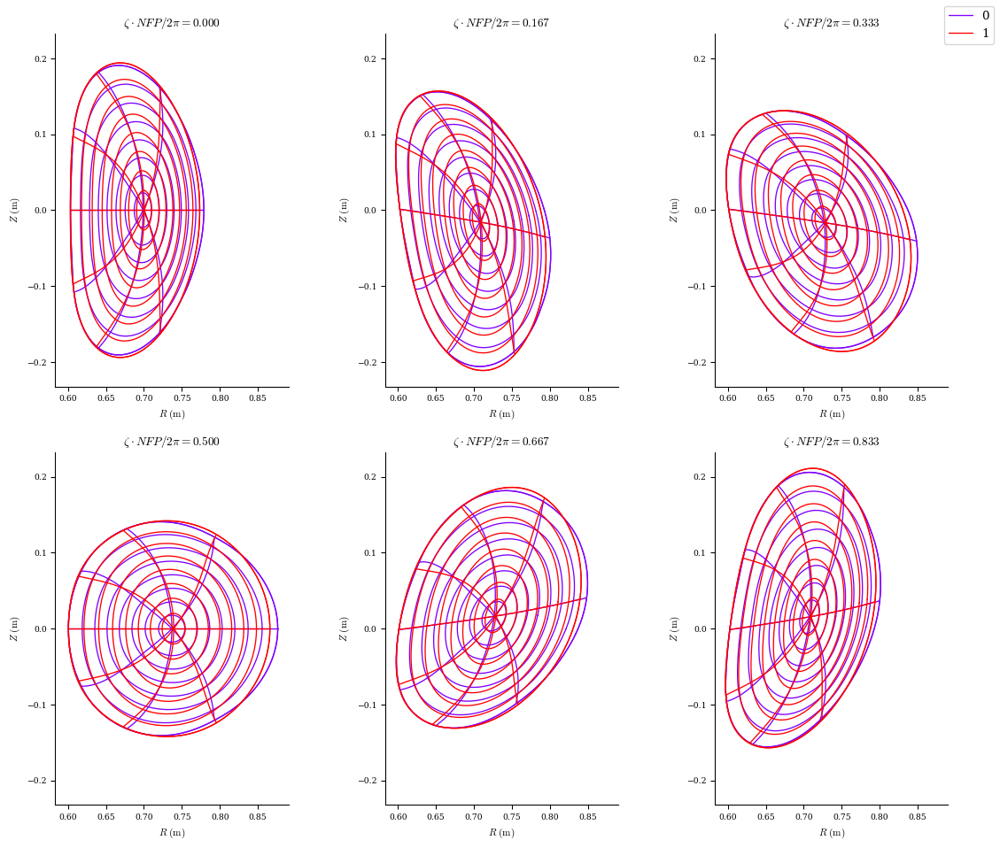

In [52]:
plot_comparison([eqs[-1]] + [veq]);

In [53]:
eq_temp = optimal_perturb(
    eqs[-1],
    fb_objective1,
    bc_objective1,
    dRb=True,
    dZb=True,
    order=2,
    tr_ratio=[0.05, 0.05],
    verbose=3,
    copy=True,)
eqs.append(eq_temp[0])
eqs[-1].solve(objective=fb_objective1, maxiter=50);

Perturbing Rb_lmn, Zb_lmn
Computing df
Timer: df computation = 5.95 sec
Computing dg
Timer: dg computation = 6.24 min
Factoring LHS
Timer: LHS factorization = 114 ms
Computing d^2f
Timer: d^2f computation = 198 ms
Computing d^2g
Timer: d^2g computation = 2.33 sec
||dc||/||c|| =  6.500e-03
||dx||/||x|| =  4.368e-02
Timer: Total perturbation = 6.50 min
Factorizing linear constraints
Starting optimization
Optimization terminated successfully.
`ftol` condition satisfied.
         Current function value: 9.257e+01
         Iterations: 5
         Function evaluations: 10
         Jacobian evaluations: 6
Start of solver
Total (sum of squares):  1.773e+08, 
Total force:  1.883e+04 (N)
End of solver
Total (sum of squares):  9.257e+01, 
Total force:  1.361e+01 (N)


In [54]:
print_error_summary(eqs)

Total force:  3.156e+01 (N)
Boundary Pressure Imbalance:  2.878e-02 Pa
Total force:  5.204e+01 (N)
Boundary Pressure Imbalance:  6.064e-03 Pa
Total force:  2.180e+02 (N)
Boundary Pressure Imbalance:  1.454e-03 Pa
Total force:  1.445e+02 (N)
Boundary Pressure Imbalance:  2.614e-04 Pa
Total force:  1.263e+02 (N)
Boundary Pressure Imbalance:  4.826e-04 Pa
Total force:  1.546e+02 (N)
Boundary Pressure Imbalance:  3.709e-04 Pa
Total force:  1.836e+02 (N)
Boundary Pressure Imbalance:  3.089e-04 Pa
Total force:  1.381e+02 (N)
Boundary Pressure Imbalance:  2.029e-04 Pa
Total force:  1.408e+02 (N)
Boundary Pressure Imbalance:  2.312e-04 Pa
Total force:  1.479e+02 (N)
Boundary Pressure Imbalance:  1.373e-04 Pa
Total force:  1.402e+02 (N)
Boundary Pressure Imbalance:  1.184e-04 Pa
Total force:  1.432e+02 (N)
Boundary Pressure Imbalance:  1.134e-04 Pa
Total force:  1.392e+02 (N)
Boundary Pressure Imbalance:  1.018e-04 Pa
Total force:  1.409e+02 (N)
Boundary Pressure Imbalance:  1.039e-04 Pa


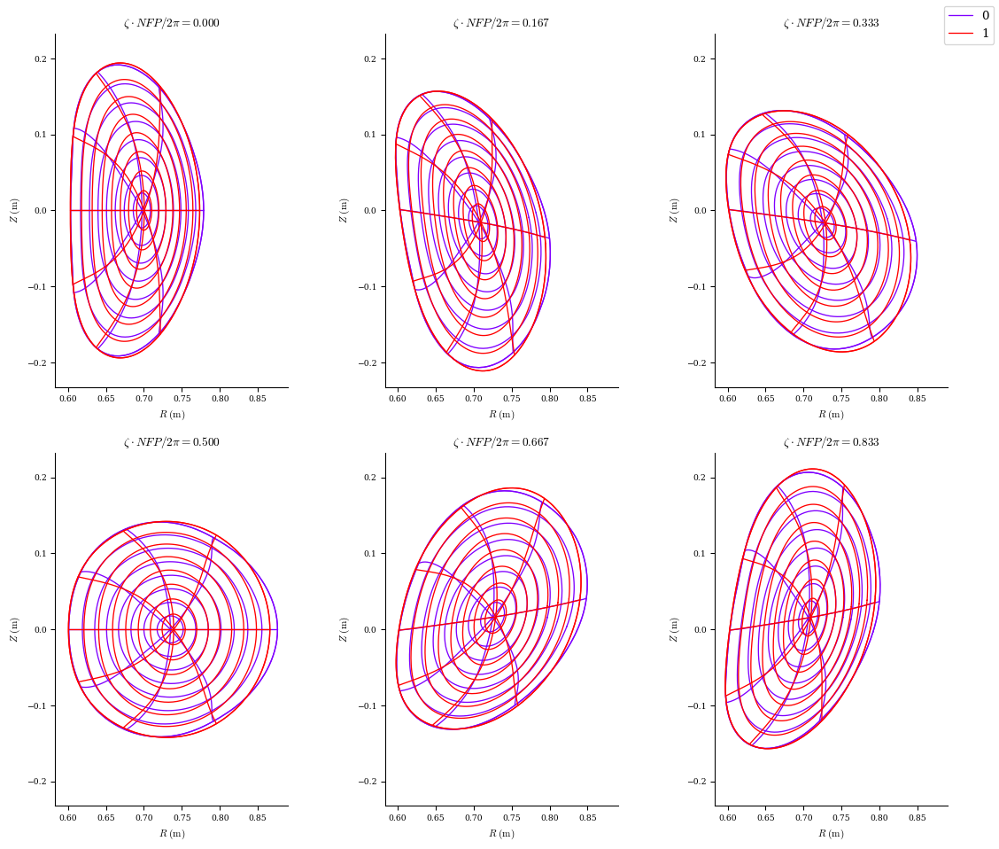

In [55]:
plot_comparison([eqs[-1]] + [veq]);

In [56]:
eq_temp = optimal_perturb(
    eqs[-1],
    fb_objective1,
    bc_objective1,
    dRb=True,
    dZb=True,
    order=2,
    tr_ratio=[0.05, 0.05],
    verbose=3,
    copy=True,)
eqs.append(eq_temp[0])
eqs[-1].solve(objective=fb_objective1, maxiter=50);

Perturbing Rb_lmn, Zb_lmn
Computing df
Timer: df computation = 6.33 sec
Computing dg
Timer: dg computation = 6.26 min
Factoring LHS
Timer: LHS factorization = 121 ms
Computing d^2f
Timer: d^2f computation = 183 ms
Computing d^2g
Timer: d^2g computation = 1.98 sec
||dc||/||c|| =  5.710e-03
||dx||/||x|| =  5.075e-02
Timer: Total perturbation = 6.52 min
Factorizing linear constraints
Starting optimization
Optimization terminated successfully.
`ftol` condition satisfied.
         Current function value: 1.628e+02
         Iterations: 6
         Function evaluations: 10
         Jacobian evaluations: 7
Start of solver
Total (sum of squares):  2.722e+08, 
Total force:  2.333e+04 (N)
End of solver
Total (sum of squares):  1.628e+02, 
Total force:  1.804e+01 (N)


In [57]:
print_error_summary(eqs)

Total force:  3.156e+01 (N)
Boundary Pressure Imbalance:  2.878e-02 Pa
Total force:  5.204e+01 (N)
Boundary Pressure Imbalance:  6.064e-03 Pa
Total force:  2.180e+02 (N)
Boundary Pressure Imbalance:  1.454e-03 Pa
Total force:  1.445e+02 (N)
Boundary Pressure Imbalance:  2.614e-04 Pa
Total force:  1.263e+02 (N)
Boundary Pressure Imbalance:  4.826e-04 Pa
Total force:  1.546e+02 (N)
Boundary Pressure Imbalance:  3.709e-04 Pa
Total force:  1.836e+02 (N)
Boundary Pressure Imbalance:  3.089e-04 Pa
Total force:  1.381e+02 (N)
Boundary Pressure Imbalance:  2.029e-04 Pa
Total force:  1.408e+02 (N)
Boundary Pressure Imbalance:  2.312e-04 Pa
Total force:  1.479e+02 (N)
Boundary Pressure Imbalance:  1.373e-04 Pa
Total force:  1.402e+02 (N)
Boundary Pressure Imbalance:  1.184e-04 Pa
Total force:  1.432e+02 (N)
Boundary Pressure Imbalance:  1.134e-04 Pa
Total force:  1.392e+02 (N)
Boundary Pressure Imbalance:  1.018e-04 Pa
Total force:  1.409e+02 (N)
Boundary Pressure Imbalance:  1.039e-04 Pa
Total 

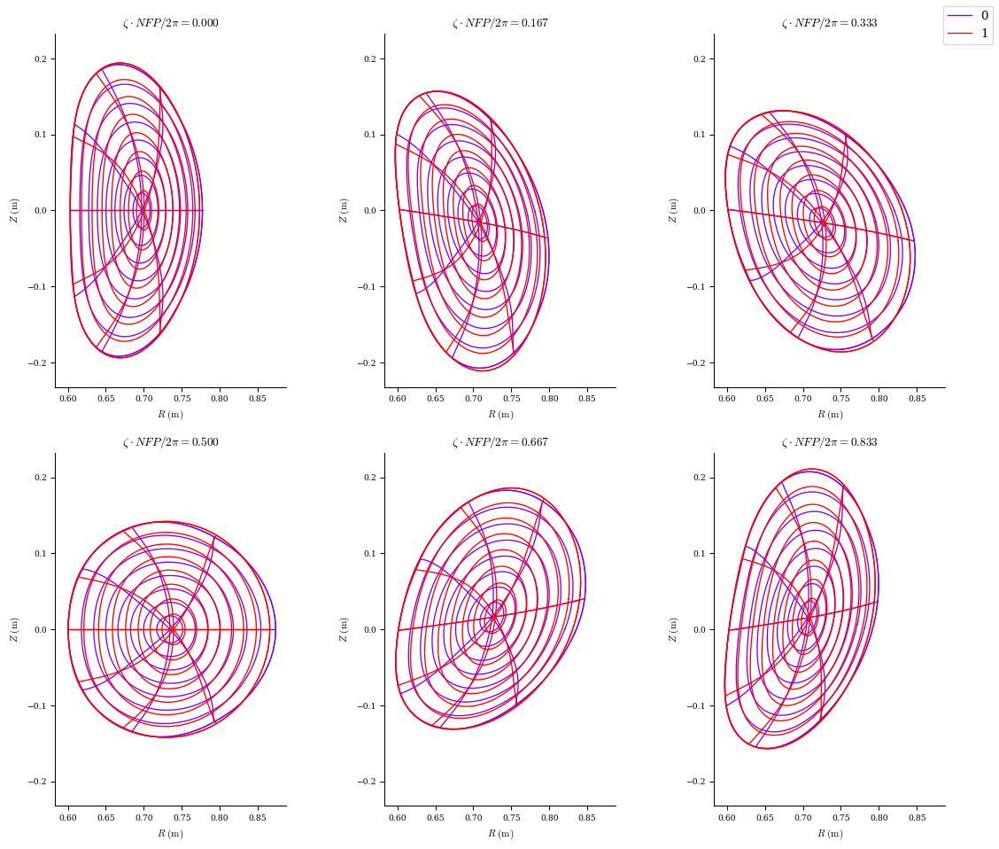

In [58]:
plot_comparison([eqs[-1]] + [veq]);

In [59]:
eq_temp = optimal_perturb(
    eqs[-1],
    fb_objective1,
    bc_objective1,
    dRb=True,
    dZb=True,
    order=2,
    tr_ratio=[0.05, 0.05],
    verbose=3,
    copy=True,)
eqs.append(eq_temp[0])
eqs[-1].solve(objective=fb_objective1, maxiter=50);

Perturbing Rb_lmn, Zb_lmn
Computing df
Timer: df computation = 5.99 sec
Computing dg
Timer: dg computation = 6.33 min
Factoring LHS
Timer: LHS factorization = 135 ms
Computing d^2f
Timer: d^2f computation = 178 ms
Computing d^2g
Timer: d^2g computation = 2.04 sec
||dc||/||c|| =  8.992e-03
||dx||/||x|| =  5.071e-02
Timer: Total perturbation = 6.58 min
Factorizing linear constraints
Starting optimization
Optimization terminated successfully.
`ftol` condition satisfied.
         Current function value: 9.707e+01
         Iterations: 5
         Function evaluations: 10
         Jacobian evaluations: 6
Start of solver
Total (sum of squares):  1.442e+10, 
Total force:  1.698e+05 (N)
End of solver
Total (sum of squares):  9.707e+01, 
Total force:  1.393e+01 (N)


In [60]:
print_error_summary(eqs)

Total force:  3.156e+01 (N)
Boundary Pressure Imbalance:  2.878e-02 Pa
Total force:  5.204e+01 (N)
Boundary Pressure Imbalance:  6.064e-03 Pa
Total force:  2.180e+02 (N)
Boundary Pressure Imbalance:  1.454e-03 Pa
Total force:  1.445e+02 (N)
Boundary Pressure Imbalance:  2.614e-04 Pa
Total force:  1.263e+02 (N)
Boundary Pressure Imbalance:  4.826e-04 Pa
Total force:  1.546e+02 (N)
Boundary Pressure Imbalance:  3.709e-04 Pa
Total force:  1.836e+02 (N)
Boundary Pressure Imbalance:  3.089e-04 Pa
Total force:  1.381e+02 (N)
Boundary Pressure Imbalance:  2.029e-04 Pa
Total force:  1.408e+02 (N)
Boundary Pressure Imbalance:  2.312e-04 Pa
Total force:  1.479e+02 (N)
Boundary Pressure Imbalance:  1.373e-04 Pa
Total force:  1.402e+02 (N)
Boundary Pressure Imbalance:  1.184e-04 Pa
Total force:  1.432e+02 (N)
Boundary Pressure Imbalance:  1.134e-04 Pa
Total force:  1.392e+02 (N)
Boundary Pressure Imbalance:  1.018e-04 Pa
Total force:  1.409e+02 (N)
Boundary Pressure Imbalance:  1.039e-04 Pa
Total 

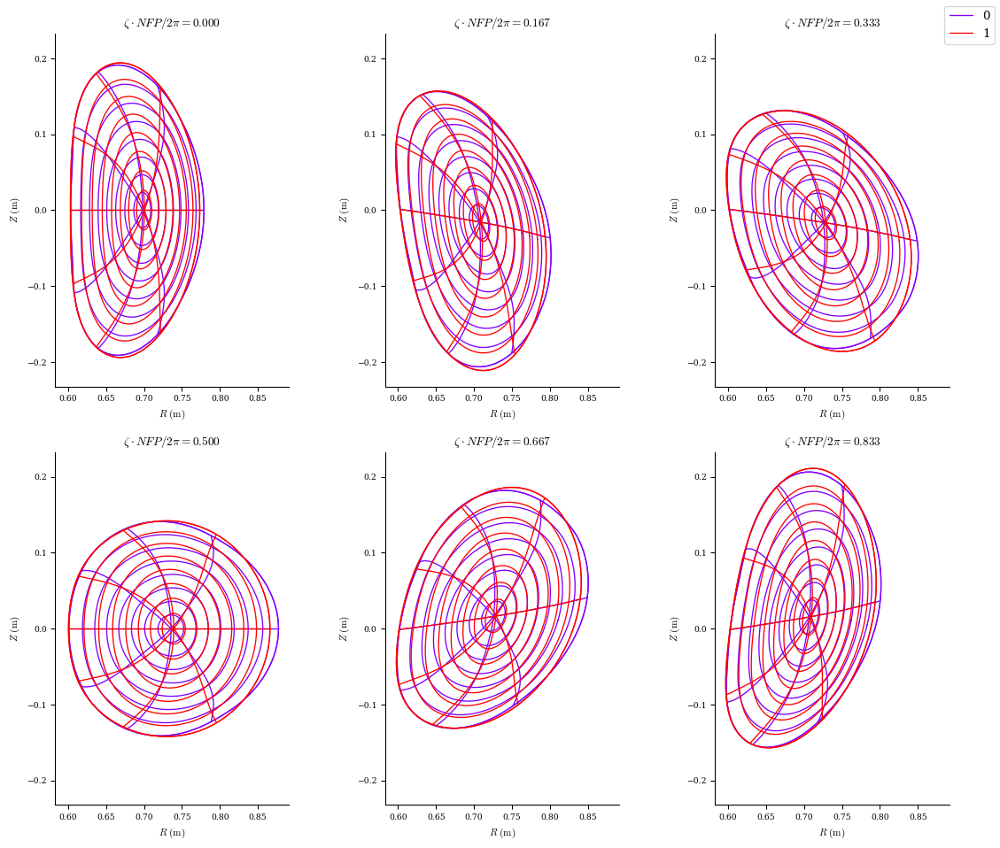

In [61]:
plot_comparison([eqs[-1]] + [veq]);

In [62]:
eq_temp = optimal_perturb(
    eqs[-1],
    fb_objective1,
    bc_objective1,
    dRb=True,
    dZb=True,
    order=2,
    tr_ratio=[0.05, 0.05],
    verbose=3,
    copy=True,)
eqs.append(eq_temp[0])
eqs[-1].solve(objective=fb_objective1, maxiter=50);

Perturbing Rb_lmn, Zb_lmn
Computing df
Timer: df computation = 6.02 sec
Computing dg
Timer: dg computation = 6.29 min
Factoring LHS
Timer: LHS factorization = 118 ms
Computing d^2f
Timer: d^2f computation = 171 ms
Computing d^2g
Timer: d^2g computation = 2.03 sec
||dc||/||c|| =  5.697e-03
||dx||/||x|| =  5.075e-02
Timer: Total perturbation = 6.55 min
Factorizing linear constraints
Starting optimization
Optimization terminated successfully.
`ftol` condition satisfied.
         Current function value: 1.817e+02
         Iterations: 7
         Function evaluations: 13
         Jacobian evaluations: 8
Start of solver
Total (sum of squares):  5.415e+09, 
Total force:  1.041e+05 (N)
End of solver
Total (sum of squares):  1.817e+02, 
Total force:  1.906e+01 (N)


In [63]:
print_error_summary(eqs)

Total force:  3.156e+01 (N)
Boundary Pressure Imbalance:  2.878e-02 Pa
Total force:  5.204e+01 (N)
Boundary Pressure Imbalance:  6.064e-03 Pa
Total force:  2.180e+02 (N)
Boundary Pressure Imbalance:  1.454e-03 Pa
Total force:  1.445e+02 (N)
Boundary Pressure Imbalance:  2.614e-04 Pa
Total force:  1.263e+02 (N)
Boundary Pressure Imbalance:  4.826e-04 Pa
Total force:  1.546e+02 (N)
Boundary Pressure Imbalance:  3.709e-04 Pa
Total force:  1.836e+02 (N)
Boundary Pressure Imbalance:  3.089e-04 Pa
Total force:  1.381e+02 (N)
Boundary Pressure Imbalance:  2.029e-04 Pa
Total force:  1.408e+02 (N)
Boundary Pressure Imbalance:  2.312e-04 Pa
Total force:  1.479e+02 (N)
Boundary Pressure Imbalance:  1.373e-04 Pa
Total force:  1.402e+02 (N)
Boundary Pressure Imbalance:  1.184e-04 Pa
Total force:  1.432e+02 (N)
Boundary Pressure Imbalance:  1.134e-04 Pa
Total force:  1.392e+02 (N)
Boundary Pressure Imbalance:  1.018e-04 Pa
Total force:  1.409e+02 (N)
Boundary Pressure Imbalance:  1.039e-04 Pa
Total 

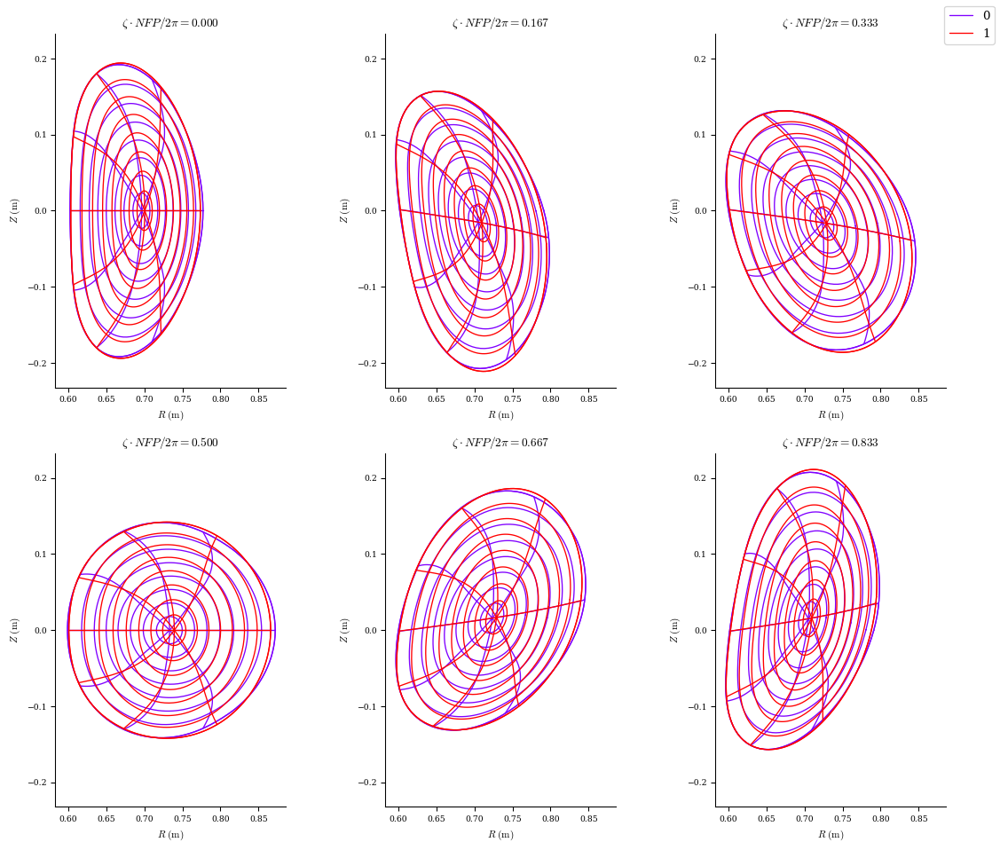

In [64]:
plot_comparison([eqs[-1]] + [veq]);

In [65]:
eq_temp = optimal_perturb(
    eqs[-1],
    fb_objective1,
    bc_objective1,
    dRb=True,
    dZb=True,
    order=2,
    tr_ratio=[0.05, 0.05],
    verbose=3,
    copy=True,)
eqs.append(eq_temp[0])
eqs[-1].solve(objective=fb_objective1, maxiter=50);

Perturbing Rb_lmn, Zb_lmn
Computing df
Timer: df computation = 5.82 sec
Computing dg
Timer: dg computation = 6.26 min
Factoring LHS
Timer: LHS factorization = 120 ms
Computing d^2f
Timer: d^2f computation = 191 ms
Computing d^2g
Timer: d^2g computation = 2.03 sec
||dc||/||c|| =  1.269e-02
||dx||/||x|| =  5.026e-02
Timer: Total perturbation = 6.51 min
Factorizing linear constraints
Starting optimization
Optimization terminated successfully.
`ftol` condition satisfied.
         Current function value: 1.596e+02
         Iterations: 20
         Function evaluations: 30
         Jacobian evaluations: 21
Start of solver
Total (sum of squares):  6.061e+19, 
Total force:  1.101e+10 (N)
End of solver
Total (sum of squares):  1.596e+02, 
Total force:  1.786e+01 (N)


In [66]:
print_error_summary(eqs)

Total force:  3.156e+01 (N)
Boundary Pressure Imbalance:  2.878e-02 Pa
Total force:  5.204e+01 (N)
Boundary Pressure Imbalance:  6.064e-03 Pa
Total force:  2.180e+02 (N)
Boundary Pressure Imbalance:  1.454e-03 Pa
Total force:  1.445e+02 (N)
Boundary Pressure Imbalance:  2.614e-04 Pa
Total force:  1.263e+02 (N)
Boundary Pressure Imbalance:  4.826e-04 Pa
Total force:  1.546e+02 (N)
Boundary Pressure Imbalance:  3.709e-04 Pa
Total force:  1.836e+02 (N)
Boundary Pressure Imbalance:  3.089e-04 Pa
Total force:  1.381e+02 (N)
Boundary Pressure Imbalance:  2.029e-04 Pa
Total force:  1.408e+02 (N)
Boundary Pressure Imbalance:  2.312e-04 Pa
Total force:  1.479e+02 (N)
Boundary Pressure Imbalance:  1.373e-04 Pa
Total force:  1.402e+02 (N)
Boundary Pressure Imbalance:  1.184e-04 Pa
Total force:  1.432e+02 (N)
Boundary Pressure Imbalance:  1.134e-04 Pa
Total force:  1.392e+02 (N)
Boundary Pressure Imbalance:  1.018e-04 Pa
Total force:  1.409e+02 (N)
Boundary Pressure Imbalance:  1.039e-04 Pa
Total 

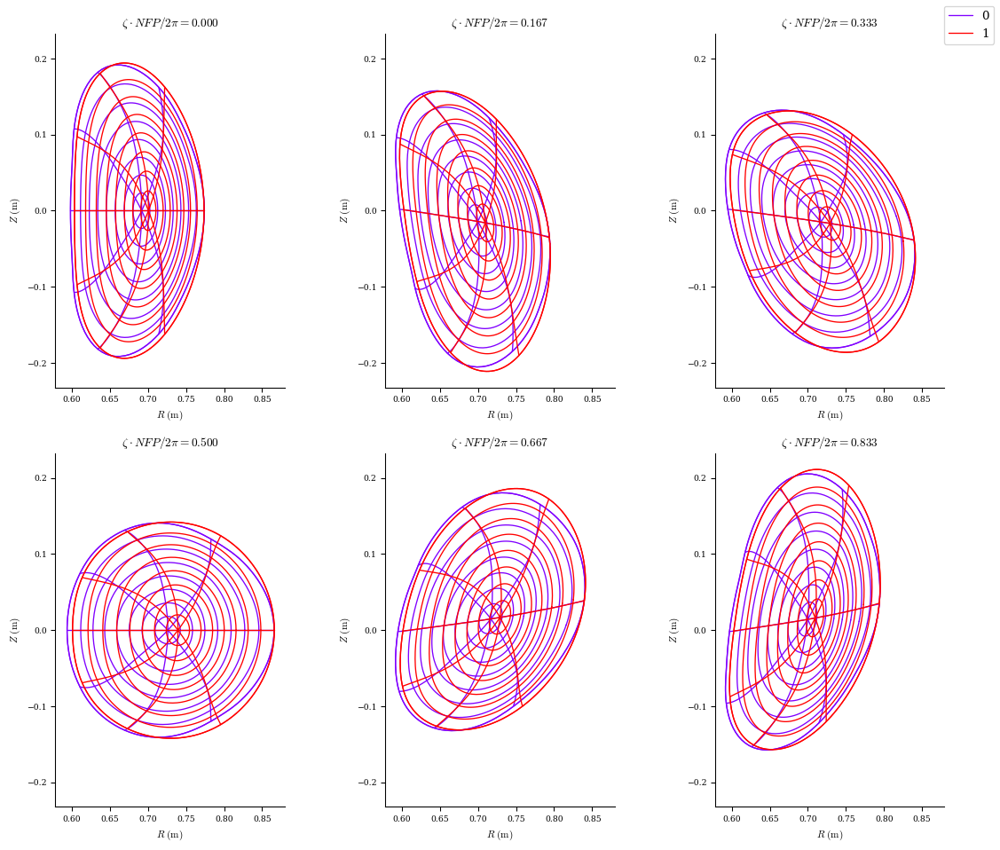

In [67]:
plot_comparison([eqs[-1]] + [veq]);

In [68]:
eq_temp = optimal_perturb(
    eqs[-1],
    fb_objective1,
    bc_objective1,
    dRb=True,
    dZb=True,
    order=2,
    tr_ratio=[0.05, 0.05],
    verbose=3,
    copy=True,)
eqs.append(eq_temp[0])
eqs[-1].solve(objective=fb_objective1, maxiter=50);

Perturbing Rb_lmn, Zb_lmn
Computing df
Timer: df computation = 5.87 sec
Computing dg
Timer: dg computation = 6.23 min
Factoring LHS
Timer: LHS factorization = 131 ms
Computing d^2f
Timer: d^2f computation = 231 ms
Computing d^2g
Timer: d^2g computation = 2.03 sec
||dc||/||c|| =  1.142e-02
||dx||/||x|| =  5.071e-02
Timer: Total perturbation = 6.48 min
Factorizing linear constraints
Starting optimization
Optimization terminated successfully.
`ftol` condition satisfied.
         Current function value: 2.079e+02
         Iterations: 6
         Function evaluations: 12
         Jacobian evaluations: 7
Start of solver
Total (sum of squares):  1.110e+16, 
Total force:  1.490e+08 (N)
End of solver
Total (sum of squares):  2.079e+02, 
Total force:  2.039e+01 (N)


In [69]:
print_error_summary(eqs)

Total force:  3.156e+01 (N)
Boundary Pressure Imbalance:  2.878e-02 Pa
Total force:  5.204e+01 (N)
Boundary Pressure Imbalance:  6.064e-03 Pa
Total force:  2.180e+02 (N)
Boundary Pressure Imbalance:  1.454e-03 Pa
Total force:  1.445e+02 (N)
Boundary Pressure Imbalance:  2.614e-04 Pa
Total force:  1.263e+02 (N)
Boundary Pressure Imbalance:  4.826e-04 Pa
Total force:  1.546e+02 (N)
Boundary Pressure Imbalance:  3.709e-04 Pa
Total force:  1.836e+02 (N)
Boundary Pressure Imbalance:  3.089e-04 Pa
Total force:  1.381e+02 (N)
Boundary Pressure Imbalance:  2.029e-04 Pa
Total force:  1.408e+02 (N)
Boundary Pressure Imbalance:  2.312e-04 Pa
Total force:  1.479e+02 (N)
Boundary Pressure Imbalance:  1.373e-04 Pa
Total force:  1.402e+02 (N)
Boundary Pressure Imbalance:  1.184e-04 Pa
Total force:  1.432e+02 (N)
Boundary Pressure Imbalance:  1.134e-04 Pa
Total force:  1.392e+02 (N)
Boundary Pressure Imbalance:  1.018e-04 Pa
Total force:  1.409e+02 (N)
Boundary Pressure Imbalance:  1.039e-04 Pa
Total 

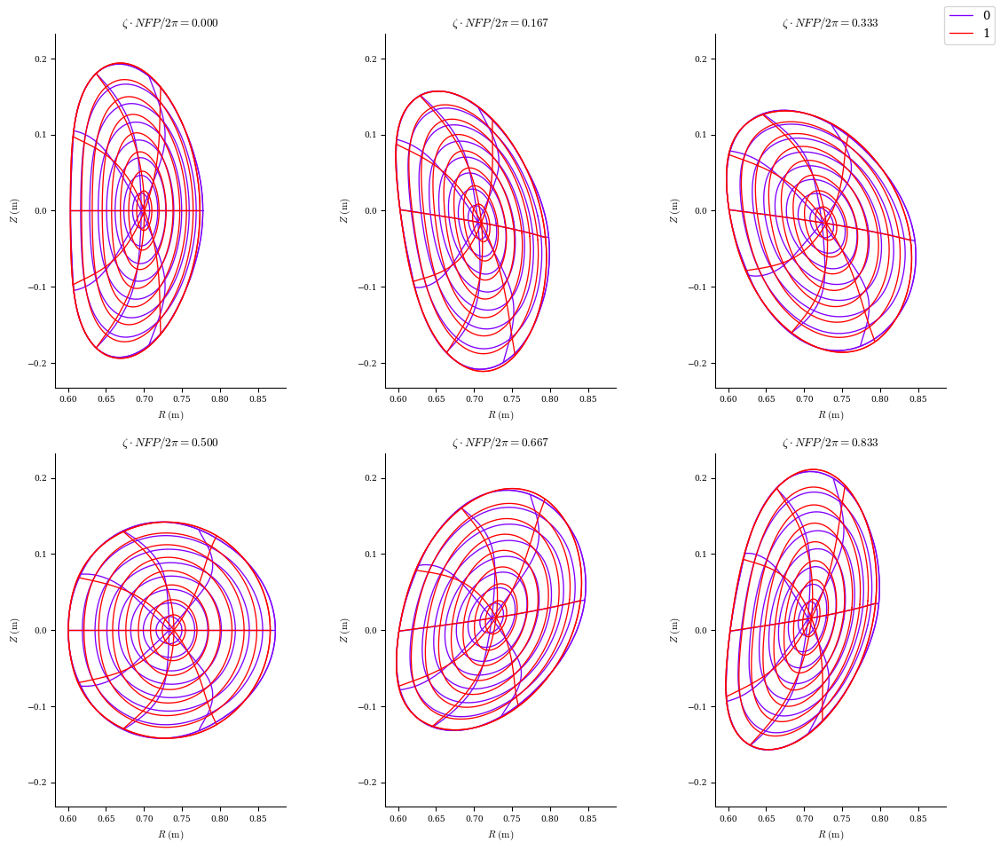

In [70]:
plot_comparison([eqs[-1]] + [veq]);

In [71]:
eq_temp = optimal_perturb(
    eqs[-1],
    fb_objective1,
    bc_objective1,
    dRb=True,
    dZb=True,
    order=2,
    tr_ratio=[0.05, 0.05],
    verbose=3,
    copy=True,)
eqs.append(eq_temp[0])
eqs[-1].solve(objective=fb_objective1, maxiter=50);

Perturbing Rb_lmn, Zb_lmn
Computing df
Timer: df computation = 6.06 sec
Computing dg
Timer: dg computation = 6.27 min
Factoring LHS
Timer: LHS factorization = 127 ms
Computing d^2f
Timer: d^2f computation = 176 ms
Computing d^2g
Timer: d^2g computation = 2.28 sec
||dc||/||c|| =  1.286e-02
||dx||/||x|| =  5.009e-02
Timer: Total perturbation = 6.53 min
Factorizing linear constraints
Starting optimization
Optimization terminated successfully.
`ftol` condition satisfied.
         Current function value: 1.822e+02
         Iterations: 6
         Function evaluations: 9
         Jacobian evaluations: 7
Start of solver
Total (sum of squares):  2.096e+15, 
Total force:  6.475e+07 (N)
End of solver
Total (sum of squares):  1.822e+02, 
Total force:  1.909e+01 (N)


In [72]:
print_error_summary(eqs)

Total force:  3.156e+01 (N)
Boundary Pressure Imbalance:  2.878e-02 Pa
Total force:  5.204e+01 (N)
Boundary Pressure Imbalance:  6.064e-03 Pa
Total force:  2.180e+02 (N)
Boundary Pressure Imbalance:  1.454e-03 Pa
Total force:  1.445e+02 (N)
Boundary Pressure Imbalance:  2.614e-04 Pa
Total force:  1.263e+02 (N)
Boundary Pressure Imbalance:  4.826e-04 Pa
Total force:  1.546e+02 (N)
Boundary Pressure Imbalance:  3.709e-04 Pa
Total force:  1.836e+02 (N)
Boundary Pressure Imbalance:  3.089e-04 Pa
Total force:  1.381e+02 (N)
Boundary Pressure Imbalance:  2.029e-04 Pa
Total force:  1.408e+02 (N)
Boundary Pressure Imbalance:  2.312e-04 Pa
Total force:  1.479e+02 (N)
Boundary Pressure Imbalance:  1.373e-04 Pa
Total force:  1.402e+02 (N)
Boundary Pressure Imbalance:  1.184e-04 Pa
Total force:  1.432e+02 (N)
Boundary Pressure Imbalance:  1.134e-04 Pa
Total force:  1.392e+02 (N)
Boundary Pressure Imbalance:  1.018e-04 Pa
Total force:  1.409e+02 (N)
Boundary Pressure Imbalance:  1.039e-04 Pa
Total 

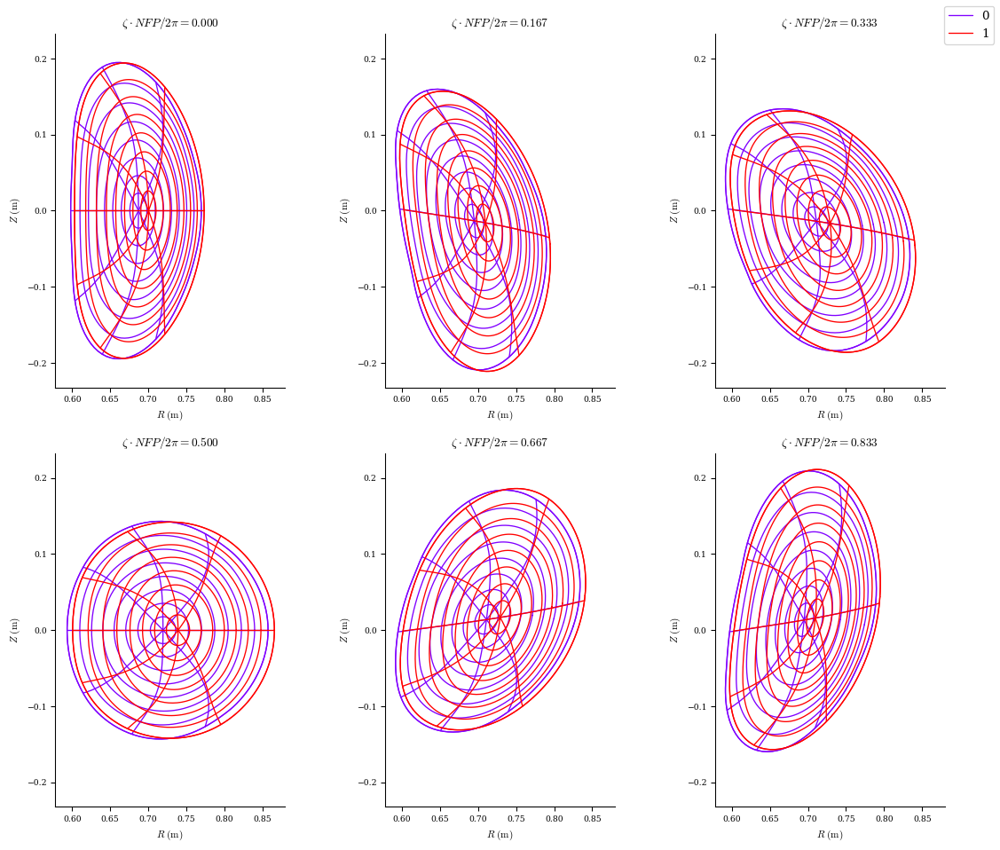

In [73]:
plot_comparison([eqs[-1]] + [veq]);

In [74]:
eq_temp = optimal_perturb(
    eqs[-1],
    fb_objective1,
    bc_objective1,
    dRb=True,
    dZb=True,
    order=2,
    tr_ratio=[0.05, 0.05],
    verbose=3,
    copy=True,)
eqs.append(eq_temp[0])
eqs[-1].solve(objective=fb_objective1, maxiter=50);

Perturbing Rb_lmn, Zb_lmn
Computing df
Timer: df computation = 6.22 sec
Computing dg
Timer: dg computation = 6.23 min
Factoring LHS
Timer: LHS factorization = 122 ms
Computing d^2f
Timer: d^2f computation = 170 ms
Computing d^2g
Timer: d^2g computation = 2.06 sec
||dc||/||c|| =  1.185e-02
||dx||/||x|| =  5.049e-02
Timer: Total perturbation = 6.49 min
Factorizing linear constraints
Starting optimization
Optimization terminated successfully.
`ftol` condition satisfied.
         Current function value: 2.007e+02
         Iterations: 5
         Function evaluations: 9
         Jacobian evaluations: 6
Start of solver
Total (sum of squares):  1.396e+20, 
Total force:  1.671e+10 (N)
End of solver
Total (sum of squares):  2.007e+02, 
Total force:  2.003e+01 (N)


In [75]:
print_error_summary(eqs)

Total force:  3.156e+01 (N)
Boundary Pressure Imbalance:  2.878e-02 Pa
Total force:  5.204e+01 (N)
Boundary Pressure Imbalance:  6.064e-03 Pa
Total force:  2.180e+02 (N)
Boundary Pressure Imbalance:  1.454e-03 Pa
Total force:  1.445e+02 (N)
Boundary Pressure Imbalance:  2.614e-04 Pa
Total force:  1.263e+02 (N)
Boundary Pressure Imbalance:  4.826e-04 Pa
Total force:  1.546e+02 (N)
Boundary Pressure Imbalance:  3.709e-04 Pa
Total force:  1.836e+02 (N)
Boundary Pressure Imbalance:  3.089e-04 Pa
Total force:  1.381e+02 (N)
Boundary Pressure Imbalance:  2.029e-04 Pa
Total force:  1.408e+02 (N)
Boundary Pressure Imbalance:  2.312e-04 Pa
Total force:  1.479e+02 (N)
Boundary Pressure Imbalance:  1.373e-04 Pa
Total force:  1.402e+02 (N)
Boundary Pressure Imbalance:  1.184e-04 Pa
Total force:  1.432e+02 (N)
Boundary Pressure Imbalance:  1.134e-04 Pa
Total force:  1.392e+02 (N)
Boundary Pressure Imbalance:  1.018e-04 Pa
Total force:  1.409e+02 (N)
Boundary Pressure Imbalance:  1.039e-04 Pa
Total 

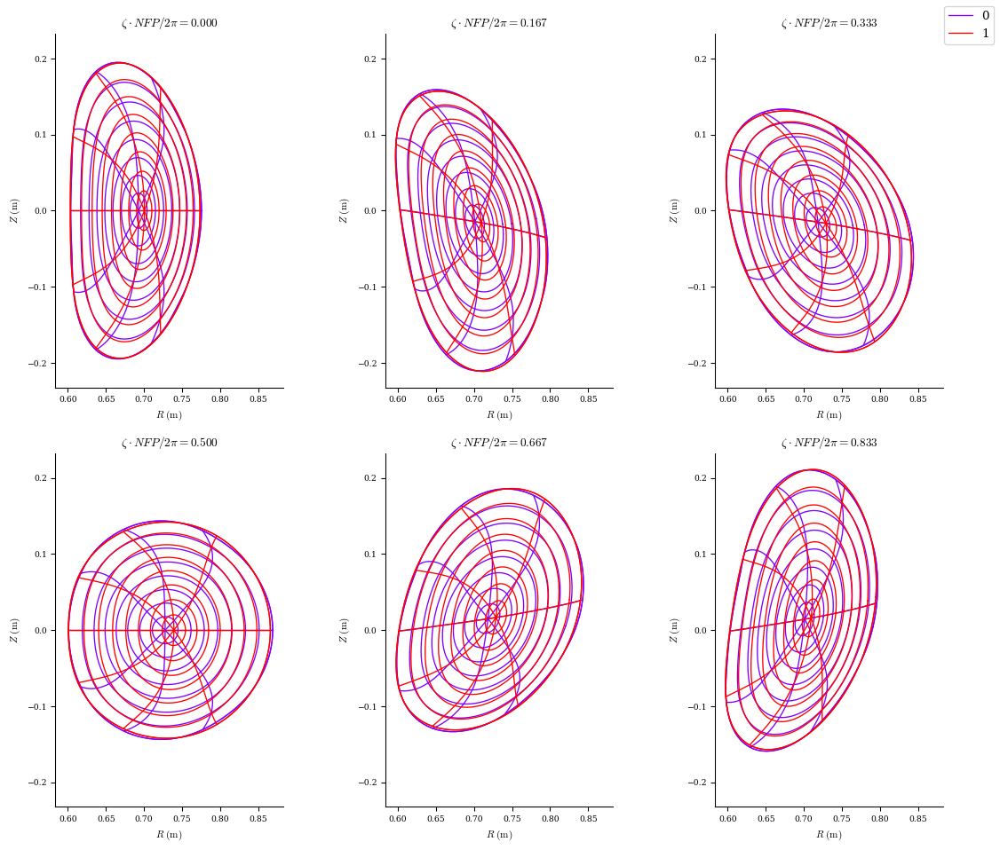

In [76]:
plot_comparison([eqs[-1]] + [veq]);

In [77]:
eq_temp = optimal_perturb(
    eqs[-1],
    fb_objective1,
    bc_objective1,
    dRb=True,
    dZb=True,
    order=2,
    tr_ratio=[0.05, 0.05],
    verbose=3,
    copy=True,)
eqs.append(eq_temp[0])
eqs[-1].solve(objective=fb_objective1, maxiter=50);

Perturbing Rb_lmn, Zb_lmn
Computing df
Timer: df computation = 5.90 sec
Computing dg
Timer: dg computation = 6.23 min
Factoring LHS
Timer: LHS factorization = 117 ms
Computing d^2f
Timer: d^2f computation = 179 ms
Computing d^2g
Timer: d^2g computation = 2.05 sec
||dc||/||c|| =  5.968e-03
||dx||/||x|| =  5.040e-02
Timer: Total perturbation = 6.48 min
Factorizing linear constraints
Starting optimization
Optimization terminated successfully.
`ftol` condition satisfied.
         Current function value: 1.329e+02
         Iterations: 9
         Function evaluations: 13
         Jacobian evaluations: 10
Start of solver
Total (sum of squares):  7.186e+10, 
Total force:  3.791e+05 (N)
End of solver
Total (sum of squares):  1.329e+02, 
Total force:  1.630e+01 (N)


In [78]:
print_error_summary(eqs)

Total force:  3.156e+01 (N)
Boundary Pressure Imbalance:  2.878e-02 Pa
Total force:  5.204e+01 (N)
Boundary Pressure Imbalance:  6.064e-03 Pa
Total force:  2.180e+02 (N)
Boundary Pressure Imbalance:  1.454e-03 Pa
Total force:  1.445e+02 (N)
Boundary Pressure Imbalance:  2.614e-04 Pa
Total force:  1.263e+02 (N)
Boundary Pressure Imbalance:  4.826e-04 Pa
Total force:  1.546e+02 (N)
Boundary Pressure Imbalance:  3.709e-04 Pa
Total force:  1.836e+02 (N)
Boundary Pressure Imbalance:  3.089e-04 Pa
Total force:  1.381e+02 (N)
Boundary Pressure Imbalance:  2.029e-04 Pa
Total force:  1.408e+02 (N)
Boundary Pressure Imbalance:  2.312e-04 Pa
Total force:  1.479e+02 (N)
Boundary Pressure Imbalance:  1.373e-04 Pa
Total force:  1.402e+02 (N)
Boundary Pressure Imbalance:  1.184e-04 Pa
Total force:  1.432e+02 (N)
Boundary Pressure Imbalance:  1.134e-04 Pa
Total force:  1.392e+02 (N)
Boundary Pressure Imbalance:  1.018e-04 Pa
Total force:  1.409e+02 (N)
Boundary Pressure Imbalance:  1.039e-04 Pa
Total 

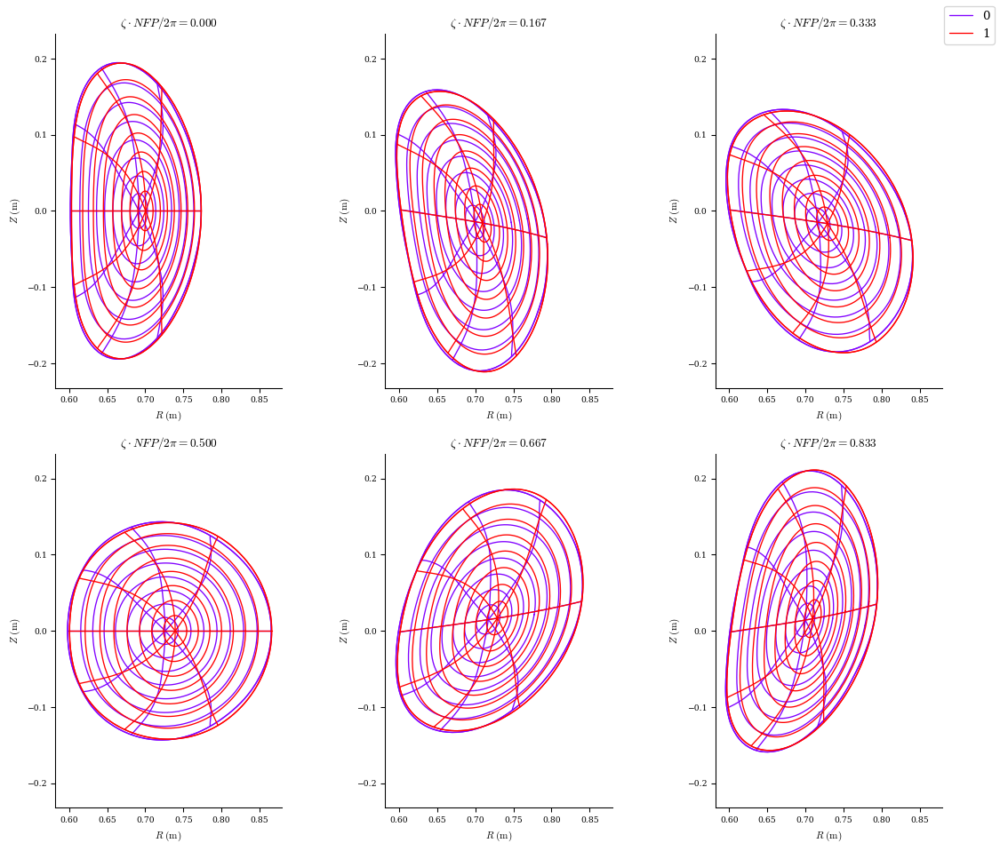

In [79]:
plot_comparison([eqs[-1]] + [veq]);

In [80]:
eq_temp = optimal_perturb(
    eqs[-1],
    fb_objective1,
    bc_objective1,
    dRb=True,
    dZb=True,
    order=2,
    tr_ratio=[0.05, 0.05],
    verbose=3,
    copy=True,)
eqs.append(eq_temp[0])
eqs[-1].solve(objective=fb_objective1, maxiter=50);

Perturbing Rb_lmn, Zb_lmn
Computing df
Timer: df computation = 5.96 sec
Computing dg
Timer: dg computation = 6.33 min
Factoring LHS
Timer: LHS factorization = 127 ms
Computing d^2f
Timer: d^2f computation = 185 ms
Computing d^2g
Timer: d^2g computation = 2.08 sec
||dc||/||c|| =  5.499e-03
||dx||/||x|| =  4.416e-02
Timer: Total perturbation = 6.59 min
Factorizing linear constraints
Starting optimization
Optimization terminated successfully.
`ftol` condition satisfied.
         Current function value: 1.411e+02
         Iterations: 4
         Function evaluations: 9
         Jacobian evaluations: 5
Start of solver
Total (sum of squares):  5.192e+21, 
Total force:  1.019e+11 (N)
End of solver
Total (sum of squares):  1.411e+02, 
Total force:  1.680e+01 (N)


In [81]:
print_error_summary(eqs)

Total force:  3.156e+01 (N)
Boundary Pressure Imbalance:  2.878e-02 Pa
Total force:  5.204e+01 (N)
Boundary Pressure Imbalance:  6.064e-03 Pa
Total force:  2.180e+02 (N)
Boundary Pressure Imbalance:  1.454e-03 Pa
Total force:  1.445e+02 (N)
Boundary Pressure Imbalance:  2.614e-04 Pa
Total force:  1.263e+02 (N)
Boundary Pressure Imbalance:  4.826e-04 Pa
Total force:  1.546e+02 (N)
Boundary Pressure Imbalance:  3.709e-04 Pa
Total force:  1.836e+02 (N)
Boundary Pressure Imbalance:  3.089e-04 Pa
Total force:  1.381e+02 (N)
Boundary Pressure Imbalance:  2.029e-04 Pa
Total force:  1.408e+02 (N)
Boundary Pressure Imbalance:  2.312e-04 Pa
Total force:  1.479e+02 (N)
Boundary Pressure Imbalance:  1.373e-04 Pa
Total force:  1.402e+02 (N)
Boundary Pressure Imbalance:  1.184e-04 Pa
Total force:  1.432e+02 (N)
Boundary Pressure Imbalance:  1.134e-04 Pa
Total force:  1.392e+02 (N)
Boundary Pressure Imbalance:  1.018e-04 Pa
Total force:  1.409e+02 (N)
Boundary Pressure Imbalance:  1.039e-04 Pa
Total 

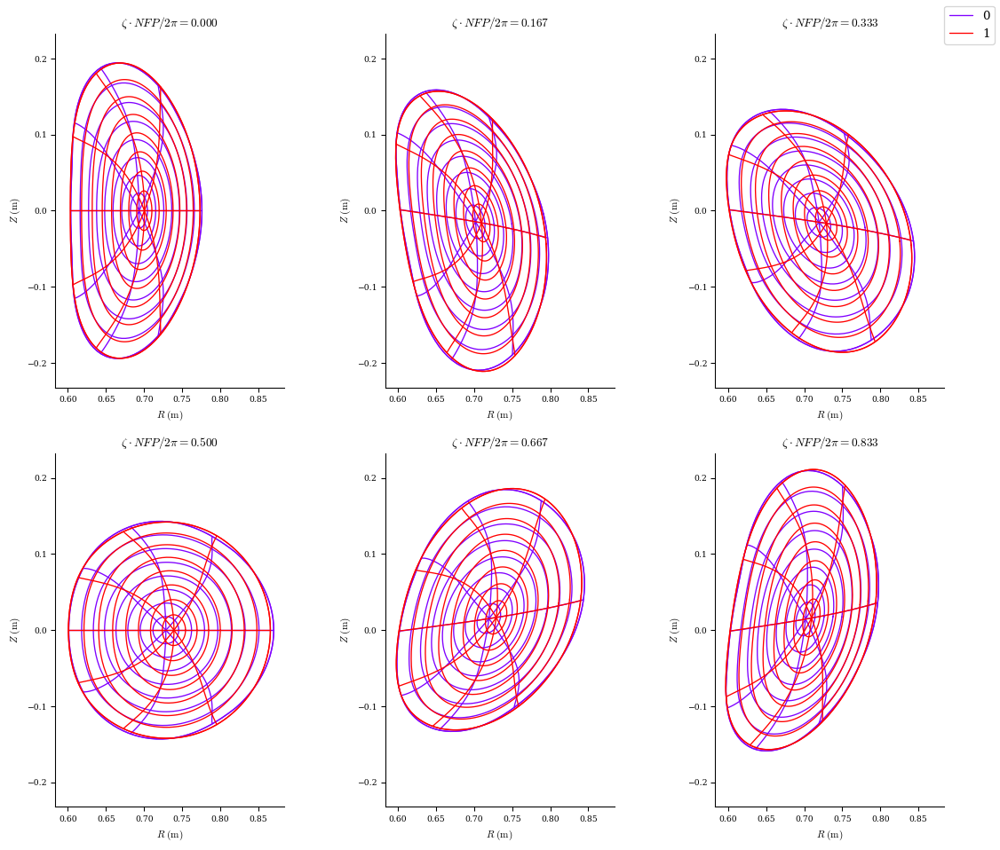

In [82]:
plot_comparison([eqs[-1]] + [veq]);

In [83]:
eq_temp = optimal_perturb(
    eqs[-1],
    fb_objective1,
    bc_objective1,
    dRb=True,
    dZb=True,
    order=2,
    tr_ratio=[0.05, 0.05],
    verbose=3,
    copy=True,)
eqs.append(eq_temp[0])
eqs[-1].solve(objective=fb_objective1, maxiter=50);

Perturbing Rb_lmn, Zb_lmn
Computing df
Timer: df computation = 5.95 sec
Computing dg
Timer: dg computation = 6.24 min
Factoring LHS
Timer: LHS factorization = 127 ms
Computing d^2f
Timer: d^2f computation = 187 ms
Computing d^2g
Timer: d^2g computation = 2.01 sec
||dc||/||c|| =  5.627e-03
||dx||/||x|| =  3.969e-02
Timer: Total perturbation = 6.50 min
Factorizing linear constraints
Starting optimization
Optimization terminated successfully.
`ftol` condition satisfied.
         Current function value: 1.364e+02
         Iterations: 7
         Function evaluations: 11
         Jacobian evaluations: 8
Start of solver
Total (sum of squares):  9.162e+19, 
Total force:  1.354e+10 (N)
End of solver
Total (sum of squares):  1.364e+02, 
Total force:  1.652e+01 (N)


In [84]:
print_error_summary(eqs)

Total force:  3.156e+01 (N)
Boundary Pressure Imbalance:  2.878e-02 Pa
Total force:  5.204e+01 (N)
Boundary Pressure Imbalance:  6.064e-03 Pa
Total force:  2.180e+02 (N)
Boundary Pressure Imbalance:  1.454e-03 Pa
Total force:  1.445e+02 (N)
Boundary Pressure Imbalance:  2.614e-04 Pa
Total force:  1.263e+02 (N)
Boundary Pressure Imbalance:  4.826e-04 Pa
Total force:  1.546e+02 (N)
Boundary Pressure Imbalance:  3.709e-04 Pa
Total force:  1.836e+02 (N)
Boundary Pressure Imbalance:  3.089e-04 Pa
Total force:  1.381e+02 (N)
Boundary Pressure Imbalance:  2.029e-04 Pa
Total force:  1.408e+02 (N)
Boundary Pressure Imbalance:  2.312e-04 Pa
Total force:  1.479e+02 (N)
Boundary Pressure Imbalance:  1.373e-04 Pa
Total force:  1.402e+02 (N)
Boundary Pressure Imbalance:  1.184e-04 Pa
Total force:  1.432e+02 (N)
Boundary Pressure Imbalance:  1.134e-04 Pa
Total force:  1.392e+02 (N)
Boundary Pressure Imbalance:  1.018e-04 Pa
Total force:  1.409e+02 (N)
Boundary Pressure Imbalance:  1.039e-04 Pa
Total 

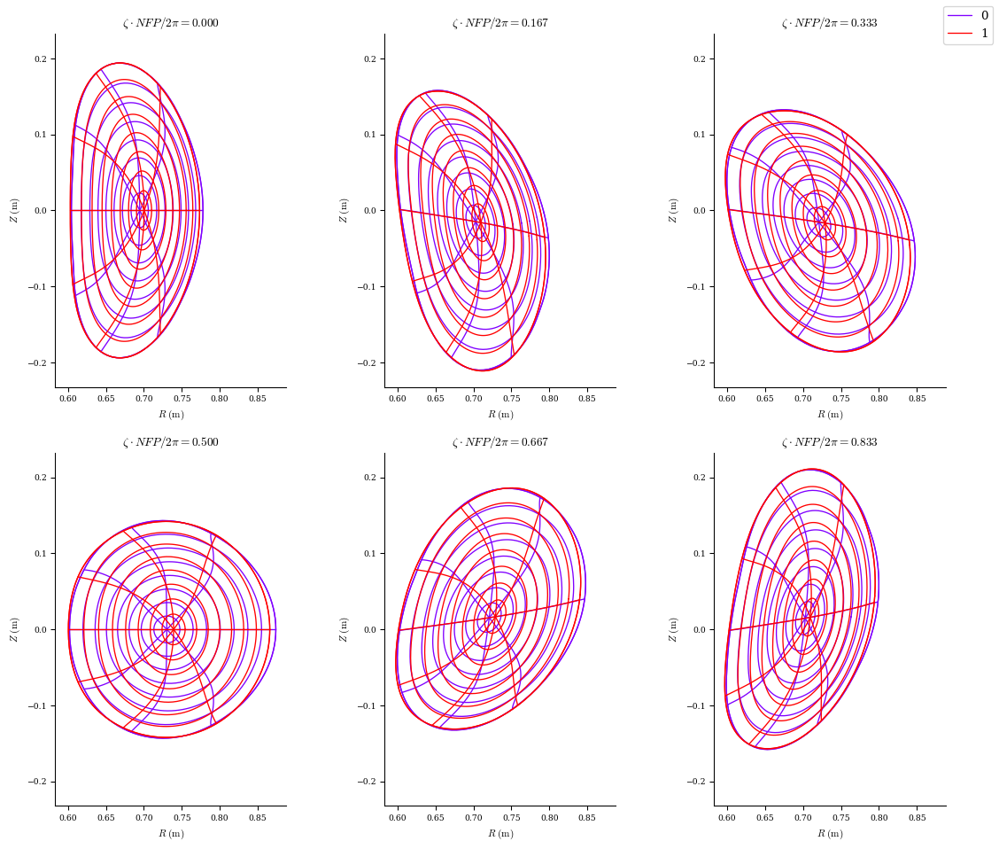

In [85]:
plot_comparison([eqs[-1]] + [veq]);

In [86]:
eq_temp = optimal_perturb(
    eqs[-1],
    fb_objective1,
    bc_objective1,
    dRb=True,
    dZb=True,
    order=2,
    tr_ratio=[0.05, 0.05],
    verbose=3,
    copy=True,)
eqs.append(eq_temp[0])
eqs[-1].solve(objective=fb_objective1, maxiter=50);

Perturbing Rb_lmn, Zb_lmn
Computing df
Timer: df computation = 6.12 sec
Computing dg
Timer: dg computation = 6.26 min
Factoring LHS
Timer: LHS factorization = 132 ms
Computing d^2f
Timer: d^2f computation = 171 ms
Computing d^2g
Timer: d^2g computation = 2.07 sec
||dc||/||c|| =  5.672e-03
||dx||/||x|| =  5.020e-02
Timer: Total perturbation = 6.52 min
Factorizing linear constraints
Starting optimization
Optimization terminated successfully.
`ftol` condition satisfied.
         Current function value: 1.739e+02
         Iterations: 13
         Function evaluations: 17
         Jacobian evaluations: 14
Start of solver
Total (sum of squares):  1.775e+10, 
Total force:  1.884e+05 (N)
End of solver
Total (sum of squares):  1.739e+02, 
Total force:  1.865e+01 (N)


In [87]:
print_error_summary(eqs)

Total force:  3.156e+01 (N)
Boundary Pressure Imbalance:  2.878e-02 Pa
Total force:  5.204e+01 (N)
Boundary Pressure Imbalance:  6.064e-03 Pa
Total force:  2.180e+02 (N)
Boundary Pressure Imbalance:  1.454e-03 Pa
Total force:  1.445e+02 (N)
Boundary Pressure Imbalance:  2.614e-04 Pa
Total force:  1.263e+02 (N)
Boundary Pressure Imbalance:  4.826e-04 Pa
Total force:  1.546e+02 (N)
Boundary Pressure Imbalance:  3.709e-04 Pa
Total force:  1.836e+02 (N)
Boundary Pressure Imbalance:  3.089e-04 Pa
Total force:  1.381e+02 (N)
Boundary Pressure Imbalance:  2.029e-04 Pa
Total force:  1.408e+02 (N)
Boundary Pressure Imbalance:  2.312e-04 Pa
Total force:  1.479e+02 (N)
Boundary Pressure Imbalance:  1.373e-04 Pa
Total force:  1.402e+02 (N)
Boundary Pressure Imbalance:  1.184e-04 Pa
Total force:  1.432e+02 (N)
Boundary Pressure Imbalance:  1.134e-04 Pa
Total force:  1.392e+02 (N)
Boundary Pressure Imbalance:  1.018e-04 Pa
Total force:  1.409e+02 (N)
Boundary Pressure Imbalance:  1.039e-04 Pa
Total 

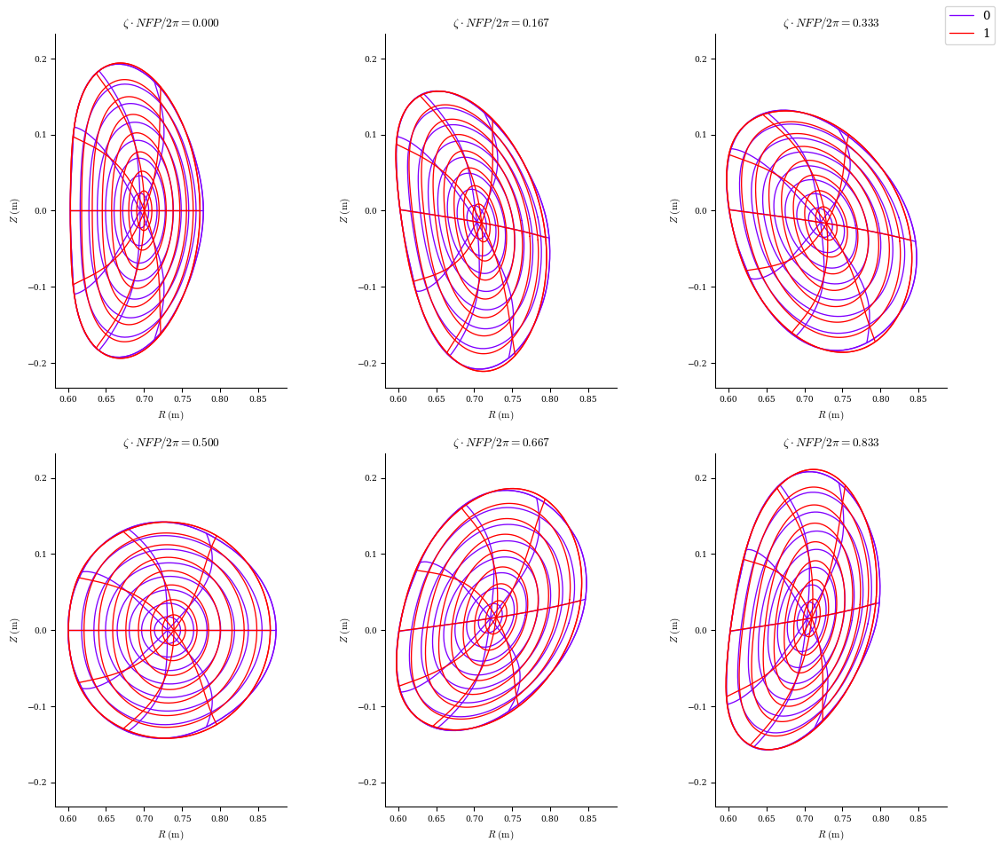

In [88]:
plot_comparison([eqs[-1]] + [veq]);

In [89]:
eq_temp = optimal_perturb(
    eqs[-1],
    fb_objective1,
    bc_objective1,
    dRb=True,
    dZb=True,
    order=2,
    tr_ratio=[0.05, 0.05],
    verbose=3,
    copy=True,)
eqs.append(eq_temp[0])
eqs[-1].solve(objective=fb_objective1, maxiter=50);

Perturbing Rb_lmn, Zb_lmn
Computing df
Timer: df computation = 5.92 sec
Computing dg
Timer: dg computation = 6.27 min
Factoring LHS
Timer: LHS factorization = 126 ms
Computing d^2f
Timer: d^2f computation = 174 ms
Computing d^2g
Timer: d^2g computation = 1.99 sec
||dc||/||c|| =  9.440e-03
||dx||/||x|| =  5.040e-02
Timer: Total perturbation = 6.53 min
Factorizing linear constraints
Starting optimization
Optimization terminated successfully.
`ftol` condition satisfied.
         Current function value: 2.918e+02
         Iterations: 4
         Function evaluations: 7
         Jacobian evaluations: 5
Start of solver
Total (sum of squares):  2.219e+10, 
Total force:  2.107e+05 (N)
End of solver
Total (sum of squares):  2.918e+02, 
Total force:  2.416e+01 (N)


In [90]:
print_error_summary(eqs)

Total force:  3.156e+01 (N)
Boundary Pressure Imbalance:  2.878e-02 Pa
Total force:  5.204e+01 (N)
Boundary Pressure Imbalance:  6.064e-03 Pa
Total force:  2.180e+02 (N)
Boundary Pressure Imbalance:  1.454e-03 Pa
Total force:  1.445e+02 (N)
Boundary Pressure Imbalance:  2.614e-04 Pa
Total force:  1.263e+02 (N)
Boundary Pressure Imbalance:  4.826e-04 Pa
Total force:  1.546e+02 (N)
Boundary Pressure Imbalance:  3.709e-04 Pa
Total force:  1.836e+02 (N)
Boundary Pressure Imbalance:  3.089e-04 Pa
Total force:  1.381e+02 (N)
Boundary Pressure Imbalance:  2.029e-04 Pa
Total force:  1.408e+02 (N)
Boundary Pressure Imbalance:  2.312e-04 Pa
Total force:  1.479e+02 (N)
Boundary Pressure Imbalance:  1.373e-04 Pa
Total force:  1.402e+02 (N)
Boundary Pressure Imbalance:  1.184e-04 Pa
Total force:  1.432e+02 (N)
Boundary Pressure Imbalance:  1.134e-04 Pa
Total force:  1.392e+02 (N)
Boundary Pressure Imbalance:  1.018e-04 Pa
Total force:  1.409e+02 (N)
Boundary Pressure Imbalance:  1.039e-04 Pa
Total 

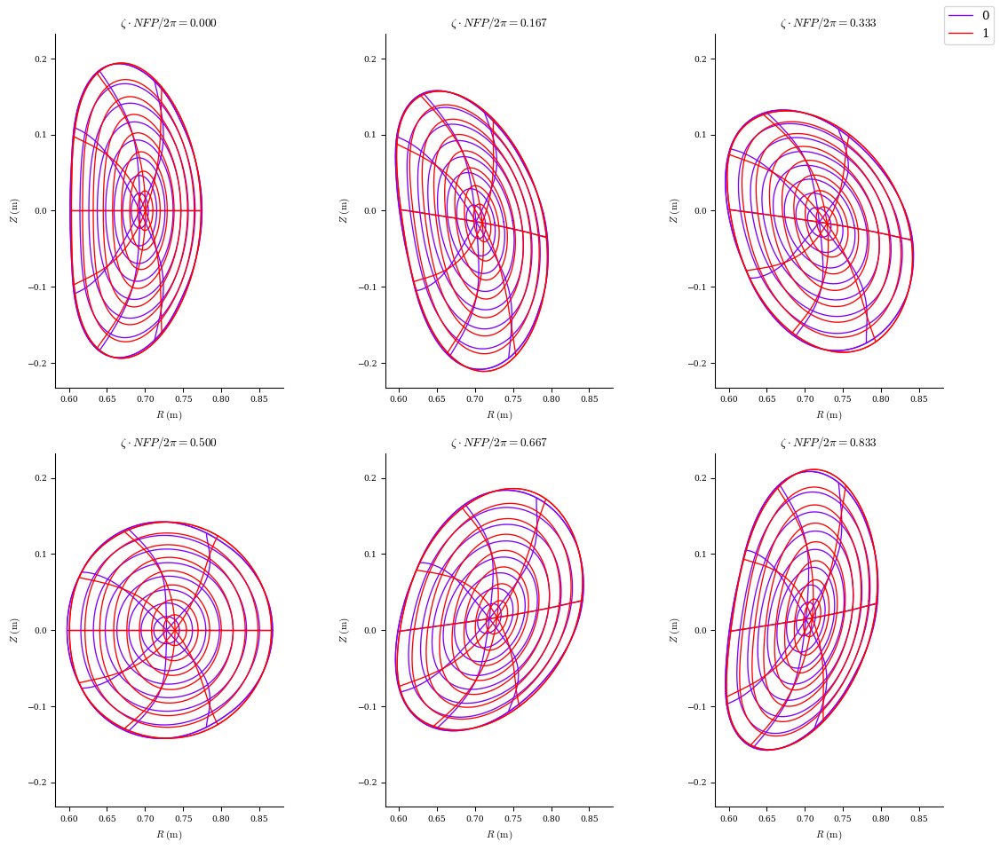

In [91]:
plot_comparison([eqs[-1]] + [veq]);

In [92]:
eq_temp = optimal_perturb(
    eqs[-1],
    fb_objective1,
    bc_objective1,
    dRb=True,
    dZb=True,
    order=2,
    tr_ratio=[0.05, 0.05],
    verbose=3,
    copy=True,)
eqs.append(eq_temp[0])
eqs[-1].solve(objective=fb_objective1, maxiter=50);

Perturbing Rb_lmn, Zb_lmn
Computing df
Timer: df computation = 5.91 sec
Computing dg
Timer: dg computation = 6.25 min
Factoring LHS
Timer: LHS factorization = 128 ms
Computing d^2f
Timer: d^2f computation = 233 ms
Computing d^2g
Timer: d^2g computation = 2.04 sec
||dc||/||c|| =  1.270e-02
||dx||/||x|| =  5.017e-02
Timer: Total perturbation = 6.51 min
Factorizing linear constraints
Starting optimization
Optimization terminated successfully.
`ftol` condition satisfied.
         Current function value: 1.566e+02
         Iterations: 7
         Function evaluations: 12
         Jacobian evaluations: 8
Start of solver
Total (sum of squares):  1.577e+18, 
Total force:  1.776e+09 (N)
End of solver
Total (sum of squares):  1.566e+02, 
Total force:  1.770e+01 (N)


In [93]:
print_error_summary(eqs)

Total force:  3.156e+01 (N)
Boundary Pressure Imbalance:  2.878e-02 Pa
Total force:  5.204e+01 (N)
Boundary Pressure Imbalance:  6.064e-03 Pa
Total force:  2.180e+02 (N)
Boundary Pressure Imbalance:  1.454e-03 Pa
Total force:  1.445e+02 (N)
Boundary Pressure Imbalance:  2.614e-04 Pa
Total force:  1.263e+02 (N)
Boundary Pressure Imbalance:  4.826e-04 Pa
Total force:  1.546e+02 (N)
Boundary Pressure Imbalance:  3.709e-04 Pa
Total force:  1.836e+02 (N)
Boundary Pressure Imbalance:  3.089e-04 Pa
Total force:  1.381e+02 (N)
Boundary Pressure Imbalance:  2.029e-04 Pa
Total force:  1.408e+02 (N)
Boundary Pressure Imbalance:  2.312e-04 Pa
Total force:  1.479e+02 (N)
Boundary Pressure Imbalance:  1.373e-04 Pa
Total force:  1.402e+02 (N)
Boundary Pressure Imbalance:  1.184e-04 Pa
Total force:  1.432e+02 (N)
Boundary Pressure Imbalance:  1.134e-04 Pa
Total force:  1.392e+02 (N)
Boundary Pressure Imbalance:  1.018e-04 Pa
Total force:  1.409e+02 (N)
Boundary Pressure Imbalance:  1.039e-04 Pa
Total 

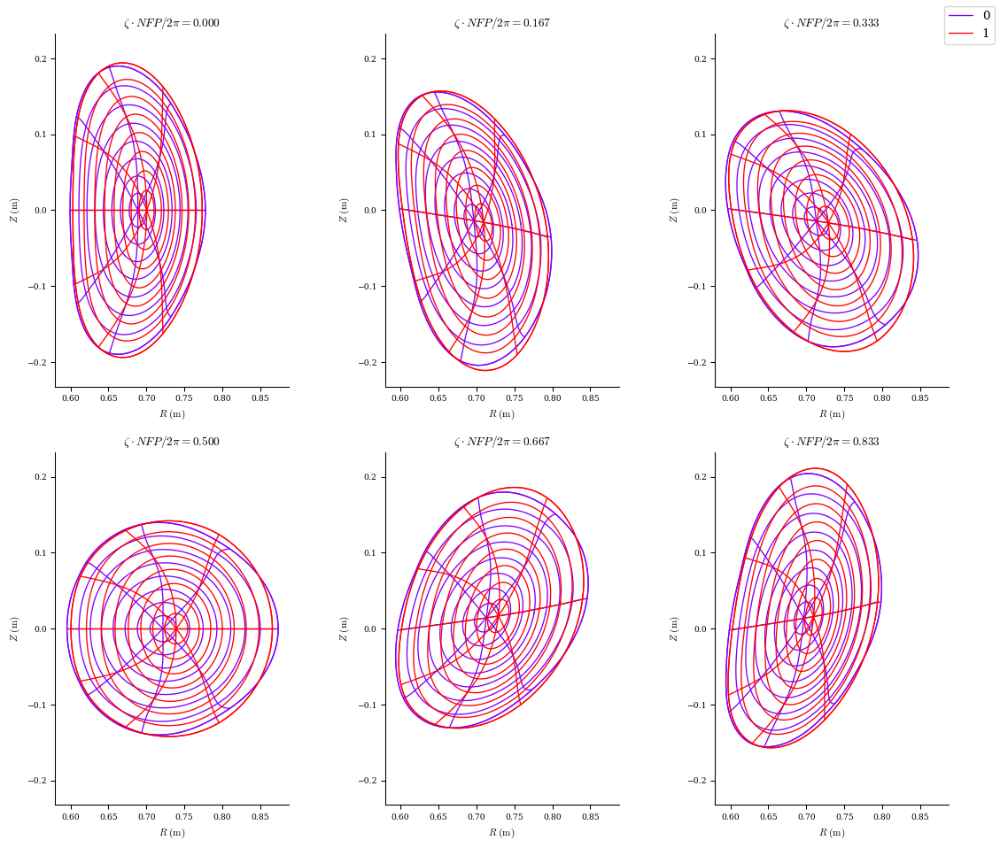

In [94]:
plot_comparison([eqs[-1]] + [veq]);

In [95]:
eq_temp = optimal_perturb(
    eqs[-1],
    fb_objective1,
    bc_objective1,
    dRb=True,
    dZb=True,
    order=2,
    tr_ratio=[0.05, 0.05],
    verbose=3,
    copy=True,)
eqs.append(eq_temp[0])
eqs[-1].solve(objective=fb_objective1, maxiter=50);

Perturbing Rb_lmn, Zb_lmn
Computing df
Timer: df computation = 7.96 sec
Computing dg
Timer: dg computation = 7.01 min
Factoring LHS
Timer: LHS factorization = 119 ms
Computing d^2f
Timer: d^2f computation = 173 ms
Computing d^2g
Timer: d^2g computation = 2.28 sec
||dc||/||c|| =  1.938e-02
||dx||/||x|| =  4.996e-02
Timer: Total perturbation = 7.32 min
Factorizing linear constraints
Starting optimization
Optimization terminated successfully.
`ftol` condition satisfied.
         Current function value: 2.101e+02
         Iterations: 17
         Function evaluations: 26
         Jacobian evaluations: 18
Start of solver
Total (sum of squares):  2.582e+17, 
Total force:  7.186e+08 (N)
End of solver
Total (sum of squares):  2.101e+02, 
Total force:  2.050e+01 (N)


In [96]:
print_error_summary(eqs)

Total force:  3.156e+01 (N)
Boundary Pressure Imbalance:  2.878e-02 Pa
Total force:  5.204e+01 (N)
Boundary Pressure Imbalance:  6.064e-03 Pa
Total force:  2.180e+02 (N)
Boundary Pressure Imbalance:  1.454e-03 Pa
Total force:  1.445e+02 (N)
Boundary Pressure Imbalance:  2.614e-04 Pa
Total force:  1.263e+02 (N)
Boundary Pressure Imbalance:  4.826e-04 Pa
Total force:  1.546e+02 (N)
Boundary Pressure Imbalance:  3.709e-04 Pa
Total force:  1.836e+02 (N)
Boundary Pressure Imbalance:  3.089e-04 Pa
Total force:  1.381e+02 (N)
Boundary Pressure Imbalance:  2.029e-04 Pa
Total force:  1.408e+02 (N)
Boundary Pressure Imbalance:  2.312e-04 Pa
Total force:  1.479e+02 (N)
Boundary Pressure Imbalance:  1.373e-04 Pa
Total force:  1.402e+02 (N)
Boundary Pressure Imbalance:  1.184e-04 Pa
Total force:  1.432e+02 (N)
Boundary Pressure Imbalance:  1.134e-04 Pa
Total force:  1.392e+02 (N)
Boundary Pressure Imbalance:  1.018e-04 Pa
Total force:  1.409e+02 (N)
Boundary Pressure Imbalance:  1.039e-04 Pa
Total 

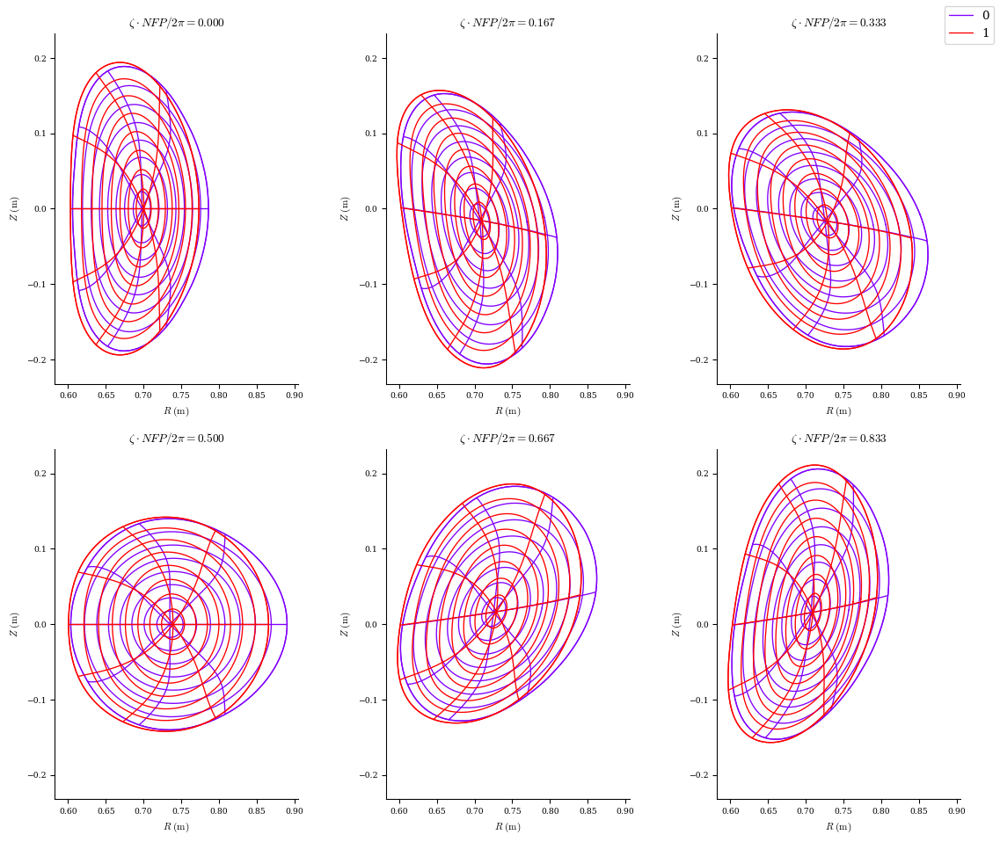

In [97]:
plot_comparison([eqs[-1]] + [veq]);

In [98]:
eq_temp = optimal_perturb(
    eqs[-1],
    fb_objective1,
    bc_objective1,
    dRb=True,
    dZb=True,
    order=2,
    tr_ratio=[0.05, 0.05],
    verbose=3,
    copy=True,)
eqs.append(eq_temp[0])
eqs[-1].solve(objective=fb_objective1, maxiter=50);

Perturbing Rb_lmn, Zb_lmn
Computing df
Timer: df computation = 9.14 sec
Computing dg
Timer: dg computation = 9.34 min
Factoring LHS
Timer: LHS factorization = 272 ms
Computing d^2f
Timer: d^2f computation = 392 ms
Computing d^2g
Timer: d^2g computation = 3.86 sec
||dc||/||c|| =  1.499e-02
||dx||/||x|| =  5.032e-02
Timer: Total perturbation = 9.87 min
Factorizing linear constraints
Starting optimization
Optimization terminated successfully.
`ftol` condition satisfied.
         Current function value: 1.488e+02
         Iterations: 10
         Function evaluations: 15
         Jacobian evaluations: 11
Start of solver
Total (sum of squares):  1.454e+25, 
Total force:  5.393e+12 (N)
End of solver
Total (sum of squares):  1.488e+02, 
Total force:  1.725e+01 (N)


In [99]:
print_error_summary(eqs)

Total force:  3.156e+01 (N)
Boundary Pressure Imbalance:  2.878e-02 Pa
Total force:  5.204e+01 (N)
Boundary Pressure Imbalance:  6.064e-03 Pa
Total force:  2.180e+02 (N)
Boundary Pressure Imbalance:  1.454e-03 Pa
Total force:  1.445e+02 (N)
Boundary Pressure Imbalance:  2.614e-04 Pa
Total force:  1.263e+02 (N)
Boundary Pressure Imbalance:  4.826e-04 Pa
Total force:  1.546e+02 (N)
Boundary Pressure Imbalance:  3.709e-04 Pa
Total force:  1.836e+02 (N)
Boundary Pressure Imbalance:  3.089e-04 Pa
Total force:  1.381e+02 (N)
Boundary Pressure Imbalance:  2.029e-04 Pa
Total force:  1.408e+02 (N)
Boundary Pressure Imbalance:  2.312e-04 Pa
Total force:  1.479e+02 (N)
Boundary Pressure Imbalance:  1.373e-04 Pa
Total force:  1.402e+02 (N)
Boundary Pressure Imbalance:  1.184e-04 Pa
Total force:  1.432e+02 (N)
Boundary Pressure Imbalance:  1.134e-04 Pa
Total force:  1.392e+02 (N)
Boundary Pressure Imbalance:  1.018e-04 Pa
Total force:  1.409e+02 (N)
Boundary Pressure Imbalance:  1.039e-04 Pa
Total 

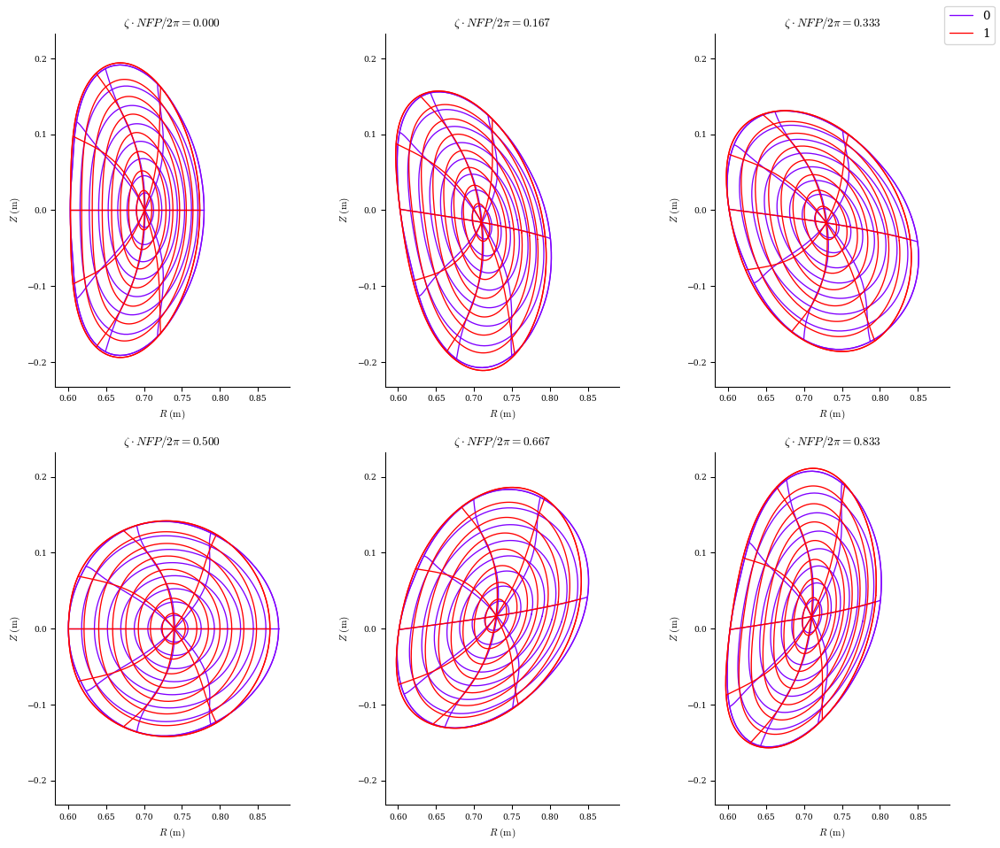

In [100]:
plot_comparison([eqs[-1]] + [veq]);

In [101]:
eq_temp = optimal_perturb(
    eqs[-1],
    fb_objective1,
    bc_objective1,
    dRb=True,
    dZb=True,
    order=2,
    tr_ratio=[0.05, 0.05],
    verbose=3,
    copy=True,)
eqs.append(eq_temp[0])
eqs[-1].solve(objective=fb_objective1, maxiter=50);

Perturbing Rb_lmn, Zb_lmn
Computing df
Timer: df computation = 17.4 sec
Computing dg
Timer: dg computation = 8.45 min
Factoring LHS
Timer: LHS factorization = 292 ms
Computing d^2f
Timer: d^2f computation = 265 ms
Computing d^2g
Timer: d^2g computation = 2.76 sec
||dc||/||c|| =  2.048e-02
||dx||/||x|| =  5.016e-02
Timer: Total perturbation = 9.10 min
Factorizing linear constraints
Starting optimization
         Current function value: 1.130e+02
         Iterations: 43
         Function evaluations: 50
         Jacobian evaluations: 44
Start of solver
Total (sum of squares):  8.641e+24, 
Total force:  4.157e+12 (N)
End of solver
Total (sum of squares):  1.130e+02, 
Total force:  1.503e+01 (N)


In [102]:
print_error_summary(eqs)

Total force:  3.156e+01 (N)
Boundary Pressure Imbalance:  2.878e-02 Pa
Total force:  5.204e+01 (N)
Boundary Pressure Imbalance:  6.064e-03 Pa
Total force:  2.180e+02 (N)
Boundary Pressure Imbalance:  1.454e-03 Pa
Total force:  1.445e+02 (N)
Boundary Pressure Imbalance:  2.614e-04 Pa
Total force:  1.263e+02 (N)
Boundary Pressure Imbalance:  4.826e-04 Pa
Total force:  1.546e+02 (N)
Boundary Pressure Imbalance:  3.709e-04 Pa
Total force:  1.836e+02 (N)
Boundary Pressure Imbalance:  3.089e-04 Pa
Total force:  1.381e+02 (N)
Boundary Pressure Imbalance:  2.029e-04 Pa
Total force:  1.408e+02 (N)
Boundary Pressure Imbalance:  2.312e-04 Pa
Total force:  1.479e+02 (N)
Boundary Pressure Imbalance:  1.373e-04 Pa
Total force:  1.402e+02 (N)
Boundary Pressure Imbalance:  1.184e-04 Pa
Total force:  1.432e+02 (N)
Boundary Pressure Imbalance:  1.134e-04 Pa
Total force:  1.392e+02 (N)
Boundary Pressure Imbalance:  1.018e-04 Pa
Total force:  1.409e+02 (N)
Boundary Pressure Imbalance:  1.039e-04 Pa
Total 

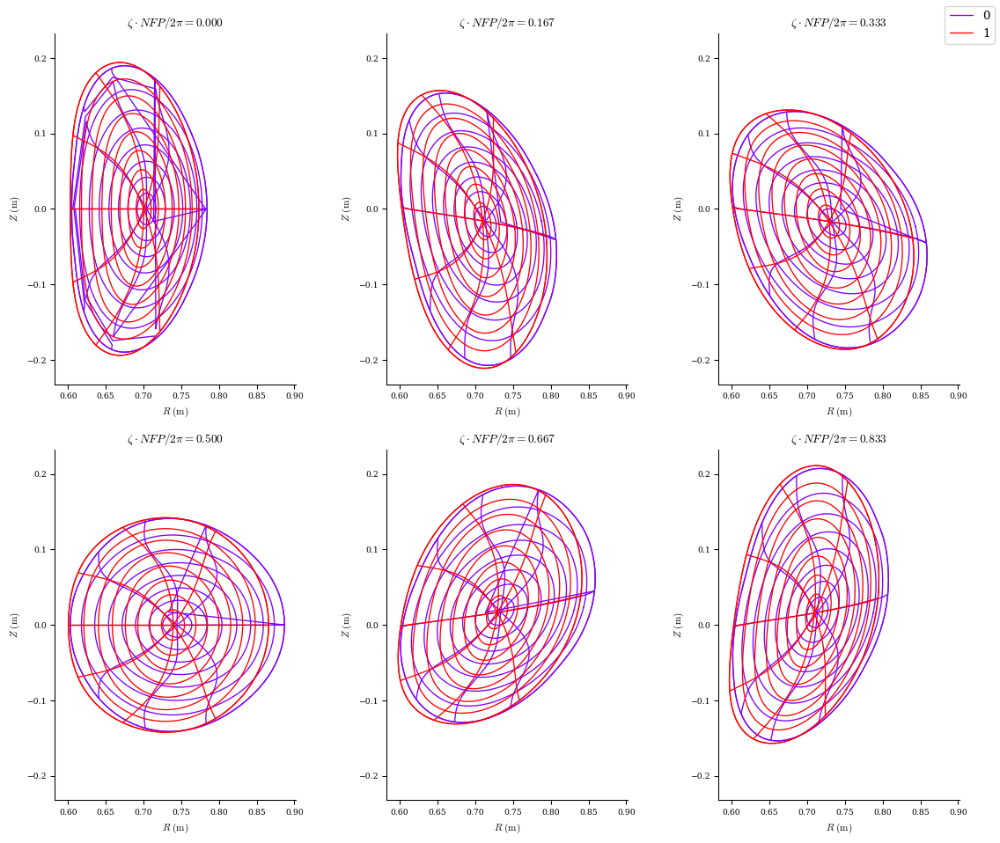

In [103]:
plot_comparison([eqs[-1]] + [veq]);

In [104]:
eq_temp = optimal_perturb(
    eqs[-1],
    fb_objective1,
    bc_objective1,
    dRb=True,
    dZb=True,
    order=2,
    tr_ratio=[0.05, 0.05],
    verbose=3,
    copy=True,)
eqs.append(eq_temp[0])
eqs[-1].solve(objective=fb_objective1, maxiter=50);

Perturbing Rb_lmn, Zb_lmn
Computing df
Timer: df computation = 7.10 sec
Computing dg
Timer: dg computation = 7.36 min
Factoring LHS
Timer: LHS factorization = 133 ms
Computing d^2f
Timer: d^2f computation = 172 ms
Computing d^2g
Timer: d^2g computation = 2.12 sec
||dc||/||c|| =  2.410e-02
||dx||/||x|| =  4.991e-02
Timer: Total perturbation = 7.66 min
Factorizing linear constraints
Starting optimization
Optimization terminated successfully.
`ftol` condition satisfied.
         Current function value: 5.136e+02
         Iterations: 10
         Function evaluations: 11
         Jacobian evaluations: 11
Start of solver
Total (sum of squares):  9.311e+18, 
Total force:  4.315e+09 (N)
End of solver
Total (sum of squares):  5.136e+02, 
Total force:  3.205e+01 (N)


In [105]:
print_error_summary(eqs)

Total force:  3.156e+01 (N)
Boundary Pressure Imbalance:  2.878e-02 Pa
Total force:  5.204e+01 (N)
Boundary Pressure Imbalance:  6.064e-03 Pa
Total force:  2.180e+02 (N)
Boundary Pressure Imbalance:  1.454e-03 Pa
Total force:  1.445e+02 (N)
Boundary Pressure Imbalance:  2.614e-04 Pa
Total force:  1.263e+02 (N)
Boundary Pressure Imbalance:  4.826e-04 Pa
Total force:  1.546e+02 (N)
Boundary Pressure Imbalance:  3.709e-04 Pa
Total force:  1.836e+02 (N)
Boundary Pressure Imbalance:  3.089e-04 Pa
Total force:  1.381e+02 (N)
Boundary Pressure Imbalance:  2.029e-04 Pa
Total force:  1.408e+02 (N)
Boundary Pressure Imbalance:  2.312e-04 Pa
Total force:  1.479e+02 (N)
Boundary Pressure Imbalance:  1.373e-04 Pa
Total force:  1.402e+02 (N)
Boundary Pressure Imbalance:  1.184e-04 Pa
Total force:  1.432e+02 (N)
Boundary Pressure Imbalance:  1.134e-04 Pa
Total force:  1.392e+02 (N)
Boundary Pressure Imbalance:  1.018e-04 Pa
Total force:  1.409e+02 (N)
Boundary Pressure Imbalance:  1.039e-04 Pa
Total 

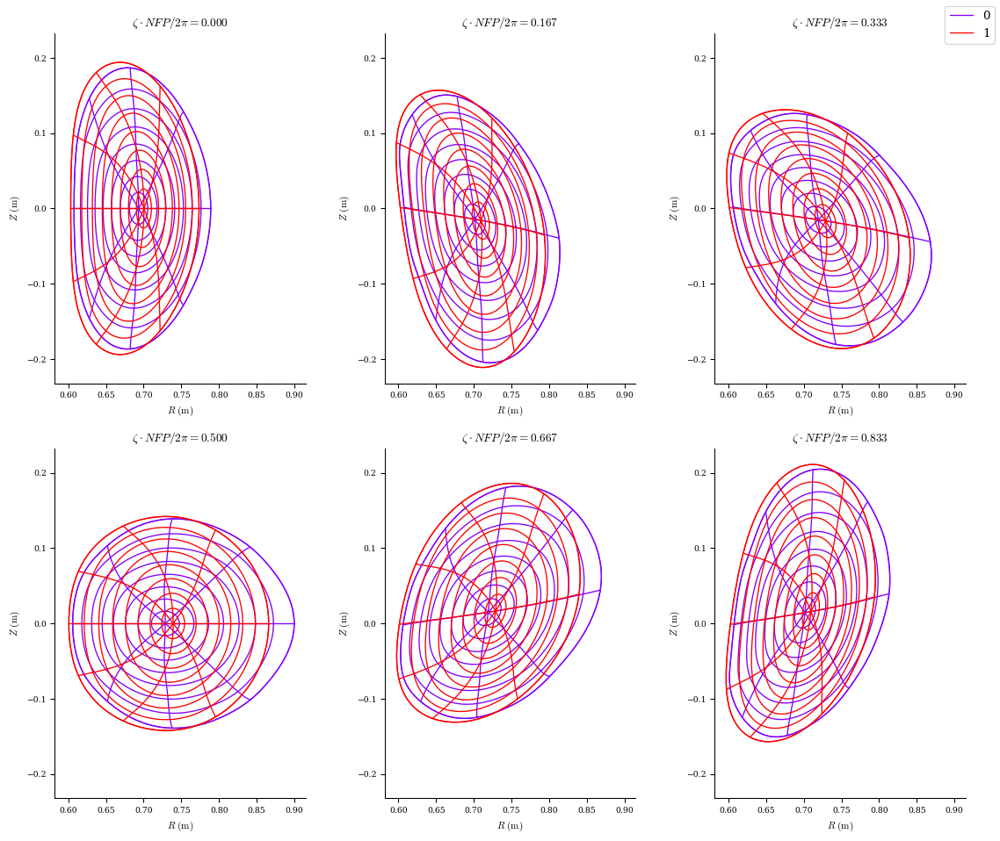

In [106]:
plot_comparison([eqs[-1]] + [veq]);

In [107]:
eq_temp = optimal_perturb(
    eqs[-1],
    fb_objective1,
    bc_objective1,
    dRb=True,
    dZb=True,
    order=2,
    tr_ratio=[0.05, 0.05],
    verbose=3,
    copy=True,)
eqs.append(eq_temp[0])
eqs[-1].solve(objective=fb_objective1, maxiter=50);

Perturbing Rb_lmn, Zb_lmn
Computing df
Timer: df computation = 7.11 sec
Computing dg
Timer: dg computation = 7.26 min
Factoring LHS
Timer: LHS factorization = 137 ms
Computing d^2f
Timer: d^2f computation = 179 ms
Computing d^2g
Timer: d^2g computation = 2.16 sec
||dc||/||c|| =  1.750e-02
||dx||/||x|| =  4.986e-02
Timer: Total perturbation = 7.55 min
Factorizing linear constraints
Starting optimization
Optimization terminated successfully.
`ftol` condition satisfied.
         Current function value: 7.447e+02
         Iterations: 10
         Function evaluations: 12
         Jacobian evaluations: 11
Start of solver
Total (sum of squares):  2.776e+19, 
Total force:  7.451e+09 (N)
End of solver
Total (sum of squares):  7.447e+02, 
Total force:  3.859e+01 (N)


In [108]:
print_error_summary(eqs)

Total force:  3.156e+01 (N)
Boundary Pressure Imbalance:  2.878e-02 Pa
Total force:  5.204e+01 (N)
Boundary Pressure Imbalance:  6.064e-03 Pa
Total force:  2.180e+02 (N)
Boundary Pressure Imbalance:  1.454e-03 Pa
Total force:  1.445e+02 (N)
Boundary Pressure Imbalance:  2.614e-04 Pa
Total force:  1.263e+02 (N)
Boundary Pressure Imbalance:  4.826e-04 Pa
Total force:  1.546e+02 (N)
Boundary Pressure Imbalance:  3.709e-04 Pa
Total force:  1.836e+02 (N)
Boundary Pressure Imbalance:  3.089e-04 Pa
Total force:  1.381e+02 (N)
Boundary Pressure Imbalance:  2.029e-04 Pa
Total force:  1.408e+02 (N)
Boundary Pressure Imbalance:  2.312e-04 Pa
Total force:  1.479e+02 (N)
Boundary Pressure Imbalance:  1.373e-04 Pa
Total force:  1.402e+02 (N)
Boundary Pressure Imbalance:  1.184e-04 Pa
Total force:  1.432e+02 (N)
Boundary Pressure Imbalance:  1.134e-04 Pa
Total force:  1.392e+02 (N)
Boundary Pressure Imbalance:  1.018e-04 Pa
Total force:  1.409e+02 (N)
Boundary Pressure Imbalance:  1.039e-04 Pa
Total 

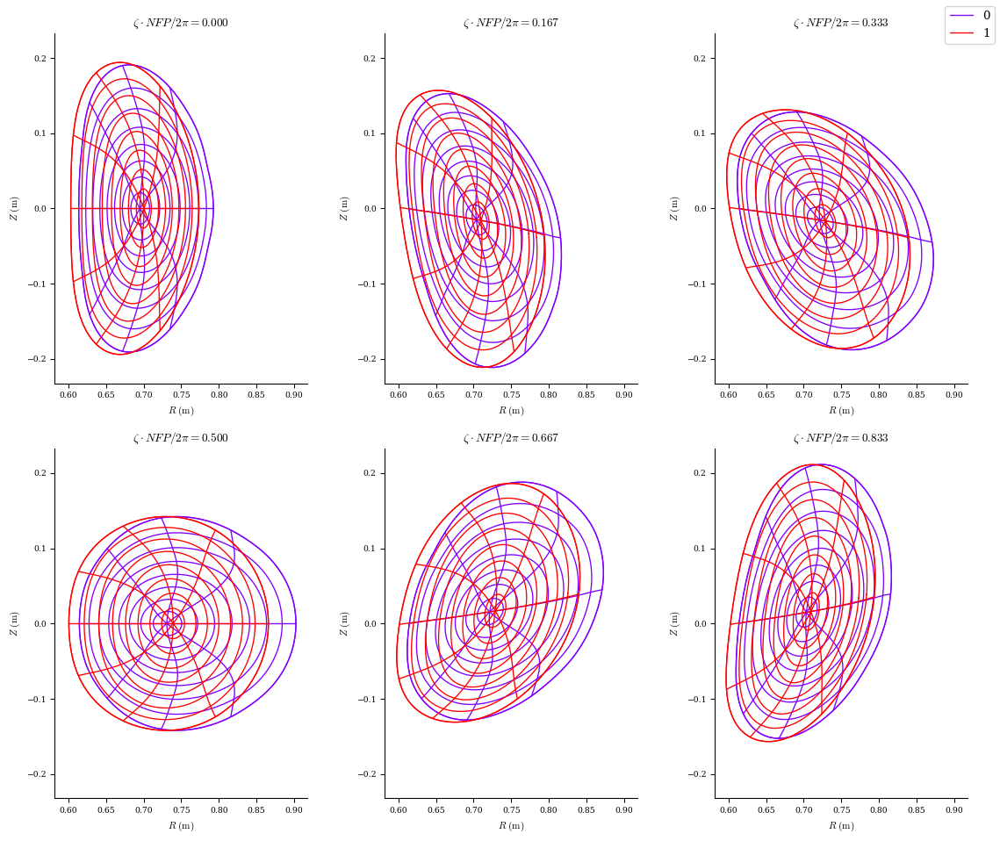

In [109]:
plot_comparison([eqs[-1]] + [veq]);

In [110]:
eq_temp = optimal_perturb(
    eqs[-1],
    fb_objective1,
    bc_objective1,
    dRb=True,
    dZb=True,
    order=2,
    tr_ratio=[0.05, 0.05],
    verbose=3,
    copy=True,)
eqs.append(eq_temp[0])
eqs[-1].solve(objective=fb_objective1, maxiter=50);

Perturbing Rb_lmn, Zb_lmn
Computing df
Timer: df computation = 6.55 sec
Computing dg
Timer: dg computation = 7.58 min
Factoring LHS
Timer: LHS factorization = 471 ms
Computing d^2f
Timer: d^2f computation = 308 ms
Computing d^2g
Timer: d^2g computation = 2.36 sec
||dc||/||c|| =  1.464e-02
||dx||/||x|| =  5.055e-02
Timer: Total perturbation = 7.92 min
Factorizing linear constraints
Starting optimization
Optimization terminated successfully.
`ftol` condition satisfied.
         Current function value: 7.242e+02
         Iterations: 19
         Function evaluations: 29
         Jacobian evaluations: 20
Start of solver
Total (sum of squares):  4.444e+19, 
Total force:  9.427e+09 (N)
End of solver
Total (sum of squares):  7.242e+02, 
Total force:  3.806e+01 (N)


In [111]:
print_error_summary(eqs)

Total force:  3.156e+01 (N)
Boundary Pressure Imbalance:  2.878e-02 Pa
Total force:  5.204e+01 (N)
Boundary Pressure Imbalance:  6.064e-03 Pa
Total force:  2.180e+02 (N)
Boundary Pressure Imbalance:  1.454e-03 Pa
Total force:  1.445e+02 (N)
Boundary Pressure Imbalance:  2.614e-04 Pa
Total force:  1.263e+02 (N)
Boundary Pressure Imbalance:  4.826e-04 Pa
Total force:  1.546e+02 (N)
Boundary Pressure Imbalance:  3.709e-04 Pa
Total force:  1.836e+02 (N)
Boundary Pressure Imbalance:  3.089e-04 Pa
Total force:  1.381e+02 (N)
Boundary Pressure Imbalance:  2.029e-04 Pa
Total force:  1.408e+02 (N)
Boundary Pressure Imbalance:  2.312e-04 Pa
Total force:  1.479e+02 (N)
Boundary Pressure Imbalance:  1.373e-04 Pa
Total force:  1.402e+02 (N)
Boundary Pressure Imbalance:  1.184e-04 Pa
Total force:  1.432e+02 (N)
Boundary Pressure Imbalance:  1.134e-04 Pa
Total force:  1.392e+02 (N)
Boundary Pressure Imbalance:  1.018e-04 Pa
Total force:  1.409e+02 (N)
Boundary Pressure Imbalance:  1.039e-04 Pa
Total 

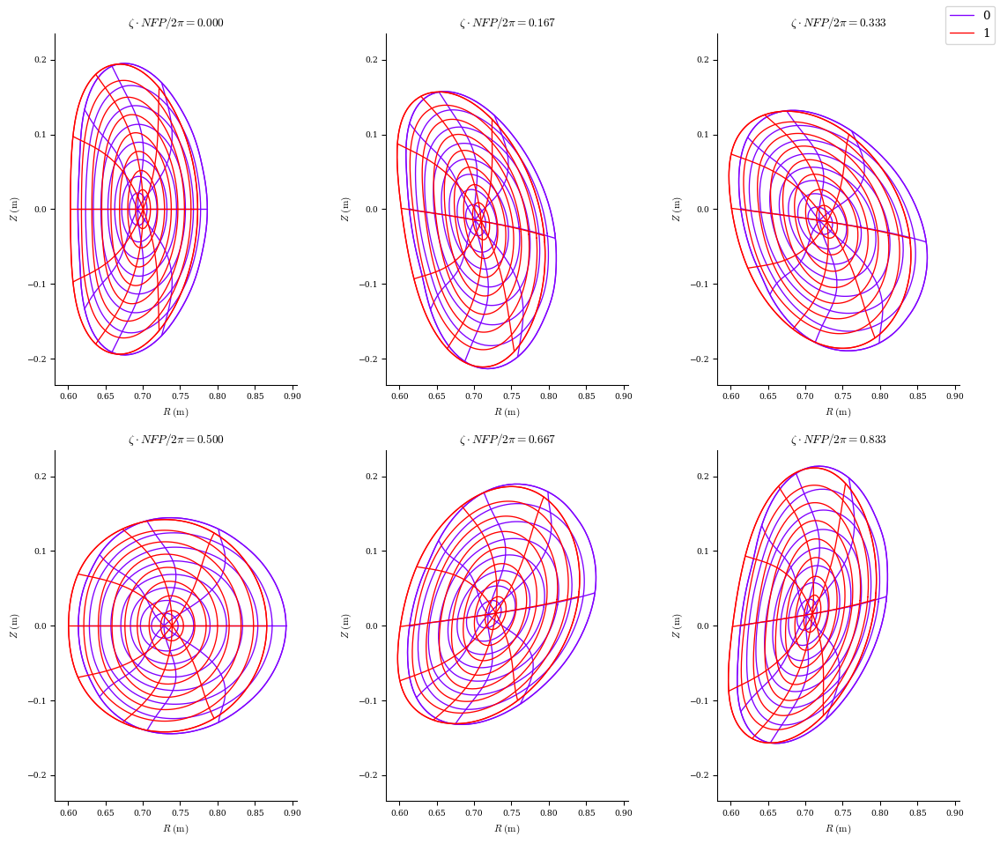

In [112]:
plot_comparison([eqs[-1]] + [veq]);